## Carga del dataset original desde drive con validaciones básicas.

In [1]:
import pandas as pd
import os

def cargar_datos(ruta_archivo, verbose=True):
    """
    Carga el dataset original desde CSV con validaciones básicas.

    Parámetros:
    ruta_archivo : str
        Ruta al archivo CSV con los datos

    Retorna:
    df : DataFrame
        Dataset cargado
    verbose : bool, default=True
        Si True, imprime información detallada

    FileNotFoundError: Si el archivo no existe
    ValueError: Si faltan columnas esenciales
    """

    print("="*60)
    print("CARGA DE DATOS")
    print("="*60)

    # Validar que el archivo existe
    if not os.path.exists(ruta_archivo):
        raise FileNotFoundError(f"No se encontró el archivo: {ruta_archivo}")

    # Cargar dataset (intentar diferentes encodings si es necesario)
    try:
        df = pd.read_csv(ruta_archivo)
    except UnicodeDecodeError:
        print("Problema de encoding, intentando con latin-1...")
        df = pd.read_csv(ruta_archivo, encoding='latin-1')

    if verbose:
        print(f"\n   ✓ Dataset cargado exitosamente")
        print(f"\n   INFORMACIÓN GENERAL:")
        print(f"      Shape: {df.shape[0]:,} filas × {df.shape[1]} columnas")

        # Verificar columnas clave
        if 'Año' in df.columns:
            print(f"      Años: {df['Año'].min()} - {df['Año'].max()}")
        if 'Pais' in df.columns:
            print(f"      Países únicos: {df['Pais'].nunique()}")

    # Validar columnas esenciales
    columnas_requeridas = ['Año', 'Pais', 'Natalidad']
    columnas_faltantes = [col for col in columnas_requeridas if col not in df.columns]

    if columnas_faltantes:
        raise ValueError(f" Faltan columnas esenciales: {columnas_faltantes}")

    # Información general
    print(f"\n Dataset cargado exitosamente")
    print(f"   Archivo: {os.path.basename(ruta_archivo)}")
    print(f"   Shape: {df.shape}")
    print(f"   Memoria: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

    # Información temporal
    print(f"\n Información Temporal:")
    print(f"   Años disponibles: {df['Año'].min()} - {df['Año'].max()}")
    print(f"   Total años: {df['Año'].nunique()}")

    # Información geográfica
    print(f"\n Información Geográfica:")
    print(f"   Países únicos: {df['Pais'].nunique()}")
    print(f"   Total registros: {len(df)}")

    # Variable objetivo
    print(f"\n Variable Objetivo: Natalidad")
    print(f"   Valores válidos: {df['Natalidad'].notna().sum()} ({df['Natalidad'].notna().sum()/len(df)*100:.1f}%)")
    print(f"   Valores faltantes: {df['Natalidad'].isna().sum()} ({df['Natalidad'].isna().sum()/len(df)*100:.1f}%)")

    if df['Natalidad'].notna().sum() > 0:
        print(f"   Rango: {df['Natalidad'].min():.2f} - {df['Natalidad'].max():.2f}")
        print(f"   Media: {df['Natalidad'].mean():.2f}")
        print(f"   Mediana: {df['Natalidad'].median():.2f}")

    # Tipos de datos
    print(f"\n Tipos de Datos:")
    tipos = df.dtypes.value_counts()
    for tipo, cantidad in tipos.items():
        print(f"   {tipo}: {cantidad} columnas")

    return df

# df =cargar_datos("/content/drive/MyDrive/Colab Notebooks/merged_dataset.csv")



### EMPECEMOS CON EL ANÁLISIS EXPLORATORIO Y LA LIMPIEZA



#### Realizamos limpieza básica del dataset: eliminamos columnas con muchos nulos, regiones geográficas y duplicados.



In [2]:
def limpieza_y_nulos(df, umbral_faltantes=60, mostrar_grafico=False):
    """
Parámetros:
    df : pd.DataFrame
        Dataset original
    umbral_faltantes : int, default=60
        Porcentaje máximo de valores faltantes permitido
    mostrar_grafico : bool, default=False
        Si True, muestra visualización de valores faltantes

Retorna:
    df_limpio : pd.DataFrame
        Dataset limpio
    resumen : dict
        Diccionario con información del proceso de limpieza
    """
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt

    print("="*70)
    print("LIMPIEZA Y ANÁLISIS DE VALORES NULOS")
    print("="*70)

    df_limpio = df.copy()

    # === 1. ANÁLISIS DE VALORES FALTANTES ===
    print("\n[1/4] Análisis de valores faltantes...")

    valores_faltantes = df_limpio.isnull().sum()
    porcentaje_faltantes = (df_limpio.isnull().sum() / len(df_limpio)) * 100

    resumen_faltantes = pd.DataFrame({
        'Columna': valores_faltantes.index,
        'Valores_Faltantes': valores_faltantes.values,
        'Porcentaje': porcentaje_faltantes.values
    })

    resumen_faltantes = resumen_faltantes[resumen_faltantes['Valores_Faltantes'] > 0]
    resumen_faltantes = resumen_faltantes.sort_values('Porcentaje', ascending=False)

    print(f"   ✓ Columnas con nulos: {len(resumen_faltantes)}/{df_limpio.shape[1]}")

    # === 2. ELIMINAR COLUMNAS CON MUCHOS NULOS ===
    print(f"\n[2/4] Eliminando columnas con >{umbral_faltantes}% de nulos...")

    columnas_eliminar = resumen_faltantes[
        resumen_faltantes['Porcentaje'] > umbral_faltantes
    ]['Columna'].tolist()

    columnas_antes = df_limpio.shape[1]
    df_limpio = df_limpio.drop(columns=columnas_eliminar)

    print(f"   ✓ Columnas eliminadas: {len(columnas_eliminar)}")
    print(f"   ✓ Columnas restantes: {df_limpio.shape[1]}")

    # === 3. ELIMINAR DUPLICADOS ===
    print(f"\n[3/4] Eliminando duplicados...")

    filas_antes = len(df_limpio)
    duplicados = df_limpio.duplicated(subset=['Pais', 'Año']).sum()

    if duplicados > 0:
        df_limpio = df_limpio.drop_duplicates(subset=['Pais', 'Año'], keep='first')
        print(f"   ✓ Duplicados eliminados: {duplicados}")
    else:
        print(f"   ✓ No se encontraron duplicados")

    # === 4. ELIMINAR REGIONES GEOGRÁFICAS ===
    print(f"\n[4/4] Eliminando regiones geográficas...")

    regiones = [
        'Africa Eastern and Southern', 'Africa Western and Central',
        'Arab World', 'Caribbean small states', 'Central Europe and the Baltics',
        'Early-demographic dividend', 'East Asia & Pacific',
        'East Asia & Pacific (excluding high income)',
        'East Asia & Pacific (IDA & IBRD countries)', 'Euro area',
        'Europe & Central Asia', 'Europe & Central Asia (excluding high income)',
        'Europe & Central Asia (IDA & IBRD countries)', 'European Union',
        'Fragile and conflict affected situations',
        'Heavily indebted poor countries (HIPC)', 'High income', 'IBRD only',
        'IDA & IBRD total', 'IDA blend', 'IDA only', 'IDA total',
        'Late-demographic dividend', 'Latin America & Caribbean',
        'Latin America & Caribbean (excluding high income)',
        'Latin America & the Caribbean (IDA & IBRD countries)',
        'Least developed countries: UN classification',
        'Low & middle income', 'Low income', 'Lower middle income',
        'Middle East, North Africa, Afghanistan & Pakistan',
        'Middle East, North Africa, Afghanistan & Pakistan (excluding high income)',
        'Middle East, North Africa, Afghanistan & Pakistan (IDA & IBRD)',
        'Middle income', 'North America', 'Not classified', 'OECD members',
        'Other small states', 'Pacific island small states',
        'Post-demographic dividend', 'Pre-demographic dividend', 'Small states',
        'South Asia', 'South Asia (IDA & IBRD)', 'Sub-Saharan Africa',
        'Sub-Saharan Africa (excluding high income)',
        'Sub-Saharan Africa (IDA & IBRD countries)', 'Upper middle income',
        'World'
    ]

    filas_antes_regiones = len(df_limpio)
    df_limpio = df_limpio[~df_limpio['Pais'].isin(regiones)].copy()

    regiones_eliminadas = filas_antes_regiones - len(df_limpio)
    print(f"   ✓ Filas de regiones eliminadas: {regiones_eliminadas}")

    # === RESUMEN FINAL ===
    print("\n" + "="*70)
    print("RESUMEN DE LIMPIEZA")
    print("="*70)
    print(f"   Dataset original:  {df.shape[0]:,} filas × {df.shape[1]} columnas")
    print(f"   Dataset limpio:    {df_limpio.shape[0]:,} filas × {df_limpio.shape[1]} columnas")
    print(f"   Reducción:         {df.shape[0] - df_limpio.shape[0]:,} filas, {df.shape[1] - df_limpio.shape[1]} columnas")

    # Preparar resumen
    resumen = {
        'dimensiones_original': df.shape,
        'dimensiones_limpio': df_limpio.shape,
        'columnas_eliminadas': columnas_eliminar,
        'duplicados_eliminados': duplicados,
        'regiones_eliminadas': regiones_eliminadas,
        'resumen_faltantes': resumen_faltantes
    }

    # Visualización opcional
    if mostrar_grafico and len(resumen_faltantes) > 0:
        # Recalcular nulos después de limpieza
        valores_faltantes_limpio = df_limpio.isnull().sum()
        porcentaje_faltantes_limpio = (df_limpio.isnull().sum() / len(df_limpio)) * 100

        resumen_limpio = pd.DataFrame({
            'Columna': valores_faltantes_limpio.index,
            'Porcentaje': porcentaje_faltantes_limpio.values
        })

        resumen_limpio = resumen_limpio[resumen_limpio['Porcentaje'] > 0]
        resumen_limpio = resumen_limpio.sort_values('Porcentaje', ascending=True)

        if len(resumen_limpio) > 0:
            fig, ax = plt.subplots(figsize=(12, 8))

            colores = ['#2ecc71' if p < 20 else '#f39c12' if p < 40 else '#e74c3c'
                      for p in resumen_limpio['Porcentaje']]

            ax.barh(resumen_limpio['Columna'], resumen_limpio['Porcentaje'], color=colores)
            ax.set_xlabel('Porcentaje de Valores Faltantes (%)', fontweight='bold')
            ax.set_title('Valores Faltantes Después de Limpieza', fontweight='bold', pad=20)
            ax.axvline(x=20, color='green', linestyle='--', alpha=0.3)
            ax.axvline(x=40, color='orange', linestyle='--', alpha=0.3)
            plt.tight_layout()
            plt.show()

    return df_limpio, resumen

# df_limpio = limpieza_y_nulos(df, umbral_faltantes=60, mostrar_grafico=False)

Realizamos el análisis univariado y bivariado enfocado en la variable objetivo que es la **Natalidad**.

In [3]:
def analisis_natalidad(df_limpio, top_n=15):
    """
Parámetros:
    df : pd.DataFrame
        Dataset limpio
    top_n : int, default=15
        Número de variables más correlacionadas a mostrar

Retorna:
    resultados : dict
        Diccionario con estadísticas y correlaciones
    """
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    print("="*70)
    print("ANÁLISIS DE NATALIDAD (UNIVARIADO Y BIVARIADO)")
    print("="*70)

    # === 1. ANÁLISIS UNIVARIADO DE NATALIDAD ===
    print("\n[1/3] Análisis univariado de Natalidad...")

    datos_natalidad = df_limpio['Natalidad'].dropna()

    estadisticas = {
        'media': datos_natalidad.mean(),
        'mediana': datos_natalidad.median(),
        'std': datos_natalidad.std(),
        'min': datos_natalidad.min(),
        'max': datos_natalidad.max(),
        'q25': datos_natalidad.quantile(0.25),
        'q75': datos_natalidad.quantile(0.75),
        'asimetria': datos_natalidad.skew(),
        'n_validos': len(datos_natalidad)
    }

    print(f"\n   Estadísticas de Natalidad:")
    print(f"      Media:    {estadisticas['media']:.2f}")
    print(f"      Mediana:  {estadisticas['mediana']:.2f}")
    print(f"      Std:      {estadisticas['std']:.2f}")
    print(f"      Rango:    [{estadisticas['min']:.2f}, {estadisticas['max']:.2f}]")
    print(f"      Asimetría: {estadisticas['asimetria']:.2f}")

    # === 2. CORRELACIONES CON NATALIDAD ===
    print(f"\n[2/3] Calculando correlaciones con Natalidad...")

    # Variables numéricas
    columnas_numericas = df_limpio.select_dtypes(include=[np.number]).columns.tolist()
    if 'Año' in columnas_numericas:
        columnas_numericas.remove('Año')
    if 'Natalidad' in columnas_numericas:
        columnas_numericas.remove('Natalidad')

    # Calcular correlaciones
    correlaciones = df_limpio[columnas_numericas + ['Natalidad']].corr()['Natalidad'].drop('Natalidad')
    correlaciones = correlaciones.sort_values(key=lambda x: abs(x), ascending=False)

    correlaciones_top = correlaciones.head(top_n)

    print(f"\n   Top {top_n} variables más correlacionadas con Natalidad:\n")
    for var, corr in correlaciones_top.items():
        tipo = "positiva" if corr > 0 else "negativa"
        print(f"      {var:<45} {corr:>7.3f}  ({tipo})")

    # === 3. VISUALIZACIONES ===
    print(f"\n[3/3] Generando visualizaciones...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Gráfico 1: Distribución de Natalidad
    axes[0, 0].hist(datos_natalidad, bins=40, color='#3498db',
                    edgecolor='black', alpha=0.7, density=True)
    datos_natalidad.plot(kind='kde', ax=axes[0, 0], color='darkred', linewidth=2.5)
    axes[0, 0].axvline(estadisticas['media'], color='red', linestyle='--',
                       linewidth=2, label=f"Media: {estadisticas['media']:.2f}")
    axes[0, 0].axvline(estadisticas['mediana'], color='green', linestyle='--',
                       linewidth=2, label=f"Mediana: {estadisticas['mediana']:.2f}")
    axes[0, 0].set_xlabel('Natalidad (nacimientos por 1000 hab)', fontweight='bold')
    axes[0, 0].set_ylabel('Densidad', fontweight='bold')
    axes[0, 0].set_title('Distribución de Natalidad', fontweight='bold', fontsize=13)
    axes[0, 0].legend()
    axes[0, 0].grid(alpha=0.3)

    # Gráfico 2: Top correlaciones
    colores = ['green' if c > 0 else 'red' for c in correlaciones_top.values]
    axes[0, 1].barh(range(len(correlaciones_top)), correlaciones_top.values, color=colores, alpha=0.7)
    axes[0, 1].set_yticks(range(len(correlaciones_top)))
    axes[0, 1].set_yticklabels(correlaciones_top.index, fontsize=9)
    axes[0, 1].axvline(x=0, color='black', linestyle='-', linewidth=1)
    axes[0, 1].set_xlabel('Correlación de Pearson', fontweight='bold')
    axes[0, 1].set_title(f'Top {top_n} Correlaciones con Natalidad', fontweight='bold', fontsize=13)
    axes[0, 1].grid(axis='x', alpha=0.3)
    axes[0, 1].invert_yaxis()

    # Gráfico 3: Evolución temporal
    datos_temporales = df_limpio.groupby('Año')['Natalidad'].mean()
    axes[1, 0].plot(datos_temporales.index, datos_temporales.values,
                    marker='o', linewidth=2.5, markersize=6, color='steelblue')

    # Línea de tendencia
    x = datos_temporales.index
    y = datos_temporales.values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    axes[1, 0].plot(x, p(x), "--", color='red', alpha=0.7, linewidth=2, label='Tendencia')

    axes[1, 0].set_xlabel('Año', fontweight='bold')
    axes[1, 0].set_ylabel('Natalidad promedio', fontweight='bold')
    axes[1, 0].set_title('Evolución Temporal de Natalidad (Promedio Global)',
                         fontweight='bold', fontsize=13)
    axes[1, 0].legend()
    axes[1, 0].grid(alpha=0.3)

    # Gráfico 4: Heatmap de correlaciones (top variables)
    top_vars = correlaciones_top.index[:10].tolist() + ['Natalidad']
    matriz_corr = df_limpio[top_vars].corr()

    sns.heatmap(matriz_corr, annot=True, fmt='.2f', cmap='RdBu_r',
                center=0, square=True, linewidths=0.5,
                cbar_kws={"shrink": 0.8}, ax=axes[1, 1],
                vmin=-1, vmax=1)
    axes[1, 1].set_title('Matriz de Correlación (Top 10 + Natalidad)',
                         fontweight='bold', fontsize=13)

    plt.tight_layout()
    plt.show()

    print("\n   ✓ Visualizaciones generadas")

    # Preparar resultados
    resultados = {
        'estadisticas': estadisticas,
        'correlaciones_todas': correlaciones,
        'correlaciones_top': correlaciones_top,
        'datos_temporales': datos_temporales
    }

    return resultados

# analisis_natalidad(df_limpio, top_n=15)

#### Eliminamos las variables con data leakage y filas con Natalidad faltante.
    
Data Leakage a tratar: Variables que son consecuencia directa de la natalidad o que contienen información que no estaría disponible al momento de hacer predicciones.

In [4]:
def limpiar_leakage(df_limpio, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks'):
    """
Parámetros
    df : pd.DataFrame
        Dataset limpio (después de limpieza_y_nulos)
    guardar_drive : bool, default=True
        Si True, guarda el dataset en Google Drive
    ruta_drive : str
        Ruta base en Google Drive para guardar

Retorna
    df_sin_leakage : pd.DataFrame
        Dataset sin variables con leakage
    resumen : dict
        Información sobre las variables eliminadas
    """
    import pandas as pd
    import os

    print("="*70)
    print("ELIMINACIÓN DE DATA LEAKAGE")
    print("="*70)

    df_sin_leakage = df_limpio.copy()

    # === 1. ELIMINAR FILAS CON NATALIDAD FALTANTE ===
    print("\n[1/3] Eliminando registros con Natalidad faltante...")

    registros_antes = len(df_sin_leakage)
    df_sin_leakage = df_sin_leakage.dropna(subset=['Natalidad'])
    registros_despues = len(df_sin_leakage)
    registros_eliminados = registros_antes - registros_despues

    print(f"   ✓ Registros eliminados: {registros_eliminados:,} ({registros_eliminados/registros_antes*100:.2f}%)")
    print(f"   ✓ Registros restantes: {registros_despues:,}")

    # === 2. ELIMINAR VARIABLES CON LEAKAGE DIRECTO ===
    print("\n[2/3] Eliminando variables con leakage directo...")

    # Variables que son CONSECUENCIA de la natalidad
    variables_leakage_directo = {
        'TasaFertilidad': 'Es otra forma de medir natalidad (hijos por mujer)',
        'MortalidadInfantil': 'Necesita nacimientos para calcularse (muertes/1000 nacidos)',
        'MortalidadMenores5': 'Necesita nacimientos para calcularse',
        'MortalidadNeonatal': 'Necesita nacimientos recientes',
        'MortalidadMaterna': 'Depende del número de embarazos/partos',
        'PrevalenciaAnemiaEmbarazadas': 'Existe en embarazadas (consecuencia de natalidad)',
        'RatioDependenciaJovenes': 'Alta dependencia = alta natalidad en últimos 14 años'
    }

    columnas_eliminar_directo = []
    for var in variables_leakage_directo.keys():
        if var in df_sin_leakage.columns:
            columnas_eliminar_directo.append(var)

    if columnas_eliminar_directo:
        df_sin_leakage = df_sin_leakage.drop(columns=columnas_eliminar_directo)

        print(f"   ✓ Variables con leakage directo eliminadas: {len(columnas_eliminar_directo)}")
        print("\n   Razones de eliminación:")
        for var in columnas_eliminar_directo:
            print(f"      • {var:<35} → {variables_leakage_directo[var]}")
    else:
        print("   ✓ No se encontraron variables con leakage directo")

    # === 3. ELIMINAR VARIABLES CON >50% MISSING (menos relevantes) ===
    print("\n[3/3] Eliminando variables con >50% missing y baja relevancia...")

    # Calcular porcentaje de missing
    porcentaje_missing = (df_sin_leakage.isnull().sum() / len(df_sin_leakage)) * 100

    # Variables con >50% missing que son menos relevantes para predicción
    variables_high_missing = {
        'EsperanzaEscolaridad': 'Ya tenemos AccesoEducacion (similar)',
        'GastoIDPorcPBI': 'No es predictor directo de natalidad'
    }

    columnas_eliminar_missing = []
    for var in variables_high_missing.keys():
        if var in df_sin_leakage.columns and porcentaje_missing[var] > 50:
            columnas_eliminar_missing.append(var)

    if columnas_eliminar_missing:
        df_sin_leakage = df_sin_leakage.drop(columns=columnas_eliminar_missing)

        print(f"   ✓ Variables eliminadas por alto missing: {len(columnas_eliminar_missing)}")
        print("\n   Razones de eliminación:")
        for var in columnas_eliminar_missing:
            pct = porcentaje_missing[var]
            print(f"      • {var:<35} → {pct:.1f}% missing - {variables_high_missing[var]}")
    else:
        print("   ✓ No se encontraron variables con alto missing a eliminar")

    # === RESUMEN FINAL ===
    print("\n" + "="*70)
    print("RESUMEN DE ELIMINACIÓN DE LEAKAGE")
    print("="*70)

    total_columnas_eliminadas = len(columnas_eliminar_directo) + len(columnas_eliminar_missing)

    print(f"\n   Dataset antes:  {df_limpio.shape[0]:,} filas × {df_limpio.shape[1]} columnas")
    print(f"   Dataset ahora:  {df_sin_leakage.shape[0]:,} filas × {df_sin_leakage.shape[1]} columnas")
    print(f"\n   Cambios:")
    print(f"      • Filas eliminadas:    {registros_eliminados:,}")
    print(f"      • Columnas eliminadas: {total_columnas_eliminadas}")
    print(f"         - Leakage directo:  {len(columnas_eliminar_directo)}")
    print(f"         - Alto missing:     {len(columnas_eliminar_missing)}")

    # Verificar que Natalidad no tenga nulos
    nulos_natalidad = df_sin_leakage['Natalidad'].isnull().sum()
    if nulos_natalidad == 0:
        print(f"\n   ✓ Variable objetivo 'Natalidad' sin valores faltantes")
    else:
        print(f"\n   WARNING: Natalidad tiene {nulos_natalidad} valores faltantes")

    # === 4. GUARDAR EN DRIVE ===
    if guardar_drive:
        print("\n" + "="*70)
        print("GUARDANDO DATASET EN GOOGLE DRIVE")
        print("="*70)

        # Crear carpeta si no existe
        carpeta = os.path.join(ruta_drive, 'datasets_natalidad')
        os.makedirs(carpeta, exist_ok=True)

        # Ruta del archivo
        ruta_archivo = os.path.join(carpeta, 'df_sin_leakage.csv')

        # Guardar
        df_sin_leakage.to_csv(ruta_archivo, index=False)

        # Tamaño del archivo
        tamaño_mb = os.path.getsize(ruta_archivo) / (1024 * 1024)

        print(f"\n   ✓ Dataset guardado exitosamente")
        print(f"    Ubicación: {ruta_archivo}")
        print(f"    Tamaño: {tamaño_mb:.2f} MB")
        print(f"    Dimensiones: {df_sin_leakage.shape[0]:,} × {df_sin_leakage.shape[1]}")

    # Preparar resumen
    resumen = {
        'registros_eliminados': registros_eliminados,
        'variables_leakage_directo': columnas_eliminar_directo,
        'variables_alto_missing': columnas_eliminar_missing,
        'total_columnas_eliminadas': total_columnas_eliminadas,
        'dimensiones_antes': df_limpio.shape,
        'dimensiones_despues': df_sin_leakage.shape,
        'justificaciones': {**variables_leakage_directo, **variables_high_missing},
        'ruta_guardado': os.path.join(ruta_drive, 'datasets_natalidad', 'df_sin_leakage.csv') if guardar_drive else None
    }

    return df_sin_leakage, resumen

# df_sin_leakage = limpiar_leakage(df_limpio, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks')

  #### Creamos features temporales para capturar tendencias y eventos históricos.
    
  Features que vamos a crear:

  - AñosDesde2000: Tendencia temporal lineal
  - Decada: Cambios de régimen por década
  - CrisisEconomica2008: Indicador de crisis financiera global
  - PandemiaCOVID: Indicador de pandemia 2020-2022

In [5]:
def crear_features_temporales(df_sin_leakage, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks'):
    """
Parámetros:
    df : pd.DataFrame
        Dataset sin leakage
    guardar_drive : bool, default=True
        Si True, guarda el dataset en Google Drive
    ruta_drive : str
        Ruta base en Google Drive

Retorna:
    df_features : pd.DataFrame
        Dataset con features temporales agregadas
    info_features : dict
        Información sobre las features creadas
    """
    import pandas as pd
    import numpy as np
    import os

    print("="*70)
    print("FEATURE ENGINEERING TEMPORAL")
    print("="*70)

    df_features = df_sin_leakage.copy()

    # Verificar que existe columna Año
    if 'Año' not in df_features.columns:
        raise KeyError("⚠ El dataset no contiene la columna 'Año'")

    año_min = df_features['Año'].min()
    año_max = df_features['Año'].max()

    print(f"\n   Rango temporal del dataset: {año_min} - {año_max}")
    print(f"   Total años únicos: {df_features['Año'].nunique()}")

    # === 1. AÑOS DESDE 2000 ===
    print("\n[1/4] Creando feature: AñosDesde2000...")

    df_features['AñosDesde2000'] = df_features['Año'] - 2000

    print(f"   ✓ Feature creada")
    print(f"      Rango: {df_features['AñosDesde2000'].min()} a {df_features['AñosDesde2000'].max()}")
    print(f"      Utilidad: Captura tendencia temporal lineal")

    # === 2. DÉCADA ===
    print("\n[2/4] Creando feature: Decada...")

    df_features['Decada'] = (df_features['Año'] // 10) * 10
    decadas_unicas = sorted(df_features['Decada'].unique())

    print(f"   ✓ Feature creada")
    print(f"      Décadas únicas: {decadas_unicas}")
    print(f"      Utilidad: Captura cambios de régimen por década")

    # Distribución por década
    dist_decada = df_features['Decada'].value_counts().sort_index()
    print(f"\n      Distribución de registros por década:")
    for decada, count in dist_decada.items():
        print(f"         {decada}s: {count:,} registros ({count/len(df_features)*100:.1f}%)")

    # === 3. CRISIS ECONÓMICA 2008 ===
    print("\n[3/4] Creando feature: CrisisEconomica2008...")

    df_features['CrisisEconomica2008'] = (
        (df_features['Año'] >= 2008) & (df_features['Año'] <= 2009)
    ).astype(int)

    registros_crisis = df_features['CrisisEconomica2008'].sum()

    print(f"   ✓ Feature creada")
    print(f"      Período: 2008-2009")
    print(f"      Registros en crisis: {registros_crisis:,} ({registros_crisis/len(df_features)*100:.2f}%)")
    print(f"      Utilidad: Captura impacto de crisis financiera global")

    # === 4. PANDEMIA COVID-19 ===
    print("\n[4/4] Creando feature: PandemiaCOVID...")

    df_features['PandemiaCOVID'] = (
        (df_features['Año'] >= 2020) & (df_features['Año'] <= 2022)
    ).astype(int)

    registros_covid = df_features['PandemiaCOVID'].sum()

    print(f"   ✓ Feature creada")
    print(f"      Período: 2020-2022")
    print(f"      Registros en pandemia: {registros_covid:,} ({registros_covid/len(df_features)*100:.2f}%)")
    print(f"      Utilidad: Captura impacto de pandemia COVID-19")

    # === RESUMEN DE FEATURES CREADAS ===
    print("\n" + "="*70)
    print("RESUMEN DE FEATURE ENGINEERING")
    print("="*70)

    features_nuevas = ['AñosDesde2000', 'Decada', 'CrisisEconomica2008', 'PandemiaCOVID']

    print(f"\n   Features temporales creadas: {len(features_nuevas)}")
    print(f"\n   Columnas antes:  {df_sin_leakage.shape[1]}")
    print(f"   Columnas ahora:  {df_features.shape[1]}")
    print(f"   Features añadidas: {df_features.shape[1] - df_sin_leakage.shape[1]}")

    print(f"\n   Lista de nuevas features:")
    for i, feat in enumerate(features_nuevas, 1):
        tipo = df_features[feat].dtype
        unicos = df_features[feat].nunique()
        print(f"      {i}. {feat:<25} (tipo: {tipo}, valores únicos: {unicos})")

    # === VERIFICACIÓN DE VALORES NULOS ===
    print(f"\n   Verificación de valores nulos en nuevas features:")
    tiene_nulos = False
    for feat in features_nuevas:
        nulos = df_features[feat].isnull().sum()
        if nulos > 0:
            print(f"       {feat}: {nulos} nulos")
            tiene_nulos = True

    if not tiene_nulos:
        print(f"      ✓ Ninguna feature temporal tiene valores nulos")

    # === GUARDAR EN DRIVE ===
    if guardar_drive:
        print("\n" + "="*70)
        print("GUARDANDO DATASET EN GOOGLE DRIVE")
        print("="*70)

        # Crear carpeta si no existe
        carpeta = os.path.join(ruta_drive, 'datasets_natalidad')
        os.makedirs(carpeta, exist_ok=True)

        # Ruta del archivo
        ruta_archivo = os.path.join(carpeta, 'df_con_features_temporales.csv')

        # Guardar
        df_features.to_csv(ruta_archivo, index=False)

        # Tamaño del archivo
        tamaño_mb = os.path.getsize(ruta_archivo) / (1024 * 1024)

        print(f"\n   ✓ Dataset guardado exitosamente")
        print(f"    Ubicación: {ruta_archivo}")
        print(f"    Tamaño: {tamaño_mb:.2f} MB")
        print(f"    Dimensiones: {df_features.shape[0]:,} × {df_features.shape[1]}")

    # === INFORMACIÓN DE FEATURES ===
    info_features = {
        'features_creadas': features_nuevas,
        'num_features_nuevas': len(features_nuevas),
        'dimensiones_antes': df_sin_leakage.shape,
        'dimensiones_despues': df_features.shape,
        'rango_temporal': (año_min, año_max),
        'decadas': decadas_unicas,
        'registros_crisis_2008': registros_crisis,
        'registros_covid': registros_covid,
        'descripcion_features': {
            'AñosDesde2000': 'Años transcurridos desde 2000 (tendencia lineal)',
            'Decada': 'Década del registro (cambios de régimen)',
            'CrisisEconomica2008': 'Indicador binario (1=2008-2009, 0=otro)',
            'PandemiaCOVID': 'Indicador binario (1=2020-2022, 0=otro)'
        },
        'ruta_guardado': os.path.join(ruta_drive, 'datasets_natalidad', 'df_con_features_temporales.csv') if guardar_drive else None
    }

    return df_features, info_features

# df_features = crear_features_temporales(df_sin_leakage, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks')

#### Particionamos el dataset temporalmente y separamos features (X) del target (y).
    
Split Temporal:
  - Train: Años <= año_corte
  - Test: Años > año_corte
    
Esto simula predicciones hacia el futuro (más realista que split aleatorio).

In [6]:
def particionar_temporal(df_features, año_corte=2021, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks'):
    """
Parámetros:
    df : pd.DataFrame
        Dataset con features temporales
    año_corte : int, default=2018
        Año que separa train/test (inclusive en train)
    guardar_drive : bool, default=True
        Si True, guarda los 4 datasets en Google Drive
    ruta_drive : str
        Ruta base en Google Drive

Retorna:
    X_train : pd.DataFrame
        Features de entrenamiento
    X_test : pd.DataFrame
        Features de prueba
    y_train : pd.Series
        Target de entrenamiento
    y_test : pd.Series
        Target de prueba
    info_particion : dict
        Información del particionamiento
    """
    import pandas as pd
    import os

    print("="*70)
    print("PARTICIONAMIENTO TEMPORAL")
    print("="*70)

    # Verificar columnas necesarias
    if 'Año' not in df_features.columns:
        raise KeyError("⚠ El dataset no contiene la columna 'Año'")
    if 'Natalidad' not in df_features.columns:
        raise KeyError("⚠ El dataset no contiene la columna 'Natalidad'")

    # === 1. SPLIT TEMPORAL ===
    print(f"\n[1/3] Realizando split temporal (año corte: {año_corte})...")

    train_mask = df_features['Año'] <= año_corte
    test_mask = df_features['Año'] > año_corte

    df_train = df_features[train_mask].copy()
    df_test = df_features[test_mask].copy()

    print(f"\n   TRAIN SET:")
    print(f"      Período: {df_train['Año'].min()} - {df_train['Año'].max()}")
    print(f"      Registros: {len(df_train):,}")
    print(f"      Años únicos: {df_train['Año'].nunique()}")
    print(f"      Países únicos: {df_train['Pais'].nunique()}")

    print(f"\n   TEST SET:")
    print(f"      Período: {df_test['Año'].min()} - {df_test['Año'].max()}")
    print(f"      Registros: {len(df_test):,}")
    print(f"      Años únicos: {df_test['Año'].nunique()}")
    print(f"      Países únicos: {df_test['Pais'].nunique()}")

    # Calcular proporciones
    total_registros = len(df_train) + len(df_test)
    prop_train = len(df_train) / total_registros * 100
    prop_test = len(df_test) / total_registros * 100

    print(f"\n   PROPORCIÓN:")
    print(f"      Train: {prop_train:.1f}%")
    print(f"      Test:  {prop_test:.1f}%")

    # === 2. SEPARAR X E Y ===
    print(f"\n[2/3] Separando features (X) y target (y)...")

    # Columnas a excluir de X (metadatos y target)
    columnas_excluir = ['Natalidad', 'Año', 'Pais', 'CodigoPais']

    # Filtrar solo las que existen
    columnas_excluir_existentes = [col for col in columnas_excluir if col in df_features.columns]

    X_train = df_train.drop(columns=columnas_excluir_existentes)
    y_train = df_train['Natalidad']

    X_test = df_test.drop(columns=columnas_excluir_existentes)
    y_test = df_test['Natalidad']

    print(f"\n   DIMENSIONES:")
    print(f"      X_train: {X_train.shape[0]:,} filas × {X_train.shape[1]} columnas")
    print(f"      y_train: {y_train.shape[0]:,} valores")
    print(f"      X_test:  {X_test.shape[0]:,} filas × {X_test.shape[1]} columnas")
    print(f"      y_test:  {y_test.shape[0]:,} valores")

    print(f"\n   FEATURES TOTALES: {X_train.shape[1]}")

    # Listar tipos de features
    tipos_features = X_train.dtypes.value_counts()
    print(f"\n   TIPOS DE FEATURES:")
    for tipo, count in tipos_features.items():
        print(f"      {tipo}: {count} features")

    # === 3. VERIFICACIONES ===
    print(f"\n   VERIFICACIONES:")

    # Verificar que no hay nulos en y
    nulos_y_train = y_train.isnull().sum()
    nulos_y_test = y_test.isnull().sum()

    if nulos_y_train == 0 and nulos_y_test == 0:
        print(f"      ✓ Target sin valores nulos")
    else:
        print(f"      WARNING: y_train tiene {nulos_y_train} nulos, y_test tiene {nulos_y_test} nulos")

    # Verificar que X y y tienen mismos índices
    if X_train.shape[0] == y_train.shape[0] and X_test.shape[0] == y_test.shape[0]:
        print(f"      ✓ X e y tienen dimensiones consistentes")
    else:
        print(f"      WARNING: Inconsistencia en dimensiones")

    # Verificar que no hay overlap temporal
    max_año_train = df_train['Año'].max()
    min_año_test = df_test['Año'].min()

    if max_año_train < min_año_test:
        print(f"      ✓ Sin overlap temporal (train hasta {max_año_train}, test desde {min_año_test})")
    else:
        print(f"      WARNING: Overlap temporal detectado")

    # Verificar distribución de Natalidad
    print(f"\n   DISTRIBUCIÓN DEL TARGET (Natalidad):")
    print(f"      Train - Media: {y_train.mean():.2f}, Std: {y_train.std():.2f}, Rango: [{y_train.min():.2f}, {y_train.max():.2f}]")
    print(f"      Test  - Media: {y_test.mean():.2f}, Std: {y_test.std():.2f}, Rango: [{y_test.min():.2f}, {y_test.max():.2f}]")

    # === 4. GUARDAR EN DRIVE ===
    if guardar_drive:
        print("\n" + "="*70)
        print("GUARDANDO DATASETS EN GOOGLE DRIVE")
        print("="*70)

        # Crear carpeta si no existe
        carpeta = os.path.join(ruta_drive, 'datasets_natalidad')
        os.makedirs(carpeta, exist_ok=True)

        # Definir rutas
        rutas = {
            'X_train': os.path.join(carpeta, 'X_train.csv'),
            'X_test': os.path.join(carpeta, 'X_test.csv'),
            'y_train': os.path.join(carpeta, 'y_train.csv'),
            'y_test': os.path.join(carpeta, 'y_test.csv')
        }

        # Guardar datasets
        X_train.to_csv(rutas['X_train'], index=False)
        X_test.to_csv(rutas['X_test'], index=False)
        y_train.to_csv(rutas['y_train'], index=False, header=True)
        y_test.to_csv(rutas['y_test'], index=False, header=True)

        print(f"\n   ✓ 4 datasets guardados exitosamente en:")
        print(f"       {carpeta}\n")

        # Mostrar info de cada archivo
        for nombre, ruta in rutas.items():
            tamaño_kb = os.path.getsize(ruta) / 1024
            print(f"      • {nombre}.csv - {tamaño_kb:.2f} KB")

    # === INFORMACIÓN DE PARTICIONAMIENTO ===
    info_particion = {
        'año_corte': año_corte,
        'train_periodo': (df_train['Año'].min(), df_train['Año'].max()),
        'test_periodo': (df_test['Año'].min(), df_test['Año'].max()),
        'train_registros': len(df_train),
        'test_registros': len(df_test),
        'proporcion_train': prop_train,
        'proporcion_test': prop_test,
        'num_features': X_train.shape[1],
        'features': X_train.columns.tolist(),
        'columnas_excluidas': columnas_excluir_existentes,
        'estadisticas_target': {
            'train_media': y_train.mean(),
            'train_std': y_train.std(),
            'test_media': y_test.mean(),
            'test_std': y_test.std()
        },
        'rutas_guardado': rutas if guardar_drive else None
    }

    print("\n" + "="*70)
    print("PARTICIONAMIENTO COMPLETADO")
    print("="*70)

    return X_train, X_test, y_train, y_test, info_particion

# X_train, X_test, y_train, y_test,info_particion = particionar_temporal(df_features, año_corte=2021, guardar_drive=True, ruta_drive='/content/drive/MyDrive/Colab Notebooks')



### PIPELINE:
Creamos el PIPELINE MAESTR que ejecuta todas las etapas de preparación de datos.
    
Etapas del pipeline:
  1. Carga de datos
  2. Limpieza y análisis de nulos
  3. Análisis de natalidad (univariado/bivariado)
  4. Eliminación de data leakage
  5. Creación de features temporales
  6. Particionamiento temporal
  7. Imputación y escalado (preparación para ML)

In [7]:
def pipeline_preparacion_datos(ruta_archivo,
                                umbral_faltantes=60,
                                año_corte=2018,
                                guardar_drive=True,
                                ruta_drive='/content/drive/MyDrive/Colab Notebooks',
                                mostrar_graficos=False):
    """
Parámetros:
    ruta_archivo : str
        Ruta al archivo CSV original
    umbral_faltantes : int, default=60
        Porcentaje máximo de valores faltantes permitido
    año_corte : int, default=2018
        Año que separa train/test
    guardar_drive : bool, default=True
        Si True, guarda datasets intermedios en Drive
    ruta_drive : str
        Ruta base en Google Drive
    mostrar_graficos : bool, default=False
        Si True, muestra visualizaciones en cada etapa

Retorna:
    X_train_prep : np.ndarray
        Features de train imputadas y escaladas
    X_test_prep : np.ndarray
        Features de test imputadas y escaladas
    y_train : pd.Series
        Target de entrenamiento
    y_test : pd.Series
        Target de prueba
    pipeline_info : dict
        Información completa de todas las etapas
    """
    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    import pandas as pd
    import time

    print("="*80)
    print(" " * 20 + "PIPELINE DE PREPARACIÓN DE DATOS")
    print("="*80)
    print(f"\n   Configuración:")
    print(f"      • Archivo: {ruta_archivo}")
    print(f"      • Umbral nulos: {umbral_faltantes}%")
    print(f"      • Año corte: {año_corte}")
    print(f"      • Guardar en Drive: {guardar_drive}")
    print(f"      • Mostrar gráficos: {mostrar_graficos}")
    print("\n" + "="*80)

    inicio_total = time.time()
    pipeline_info = {}

    # ========================================================================
    # ETAPA 1: CARGA DE DATOS
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 1/7: CARGA DE DATOS")
    print("█"*80)

    inicio = time.time()
    df = cargar_datos(ruta_archivo, verbose=True)
    tiempo_etapa1 = time.time() - inicio

    pipeline_info['etapa1_carga'] = {
        'shape': df.shape,
        'tiempo': tiempo_etapa1
    }

    # ========================================================================
    # ETAPA 2: LIMPIEZA Y NULOS
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 2/7: LIMPIEZA Y ANÁLISIS DE NULOS")
    print("█"*80)

    inicio = time.time()
    df_limpio, resumen_limpieza = limpieza_y_nulos(
        df,
        umbral_faltantes=umbral_faltantes,
        mostrar_grafico=mostrar_graficos
    )
    tiempo_etapa2 = time.time() - inicio

    pipeline_info['etapa2_limpieza'] = {
        'resumen': resumen_limpieza,
        'tiempo': tiempo_etapa2
    }

    # ========================================================================
    # ETAPA 3: ANÁLISIS DE NATALIDAD
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 3/7: ANÁLISIS DE NATALIDAD (UNIVARIADO Y BIVARIADO)")
    print("█"*80)

    inicio = time.time()
    resultados_analisis = analisis_natalidad(df_limpio, top_n=15)
    tiempo_etapa3 = time.time() - inicio

    pipeline_info['etapa3_analisis'] = {
        'resultados': resultados_analisis,
        'tiempo': tiempo_etapa3
    }

    # ========================================================================
    # ETAPA 4: ELIMINACIÓN DE LEAKAGE
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 4/7: ELIMINACIÓN DE DATA LEAKAGE")
    print("█"*80)

    inicio = time.time()
    df_sin_leakage, resumen_leakage = limpiar_leakage(
        df_limpio,
        guardar_drive=guardar_drive,
        ruta_drive=ruta_drive
    )
    tiempo_etapa4 = time.time() - inicio

    pipeline_info['etapa4_leakage'] = {
        'resumen': resumen_leakage,
        'tiempo': tiempo_etapa4
    }

    # ========================================================================
    # ETAPA 5: FEATURES TEMPORALES
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 5/7: CREACIÓN DE FEATURES TEMPORALES")
    print("█"*80)

    inicio = time.time()
    df_features, info_features = crear_features_temporales(
        df_sin_leakage,
        guardar_drive=guardar_drive,
        ruta_drive=ruta_drive
    )
    tiempo_etapa5 = time.time() - inicio

    pipeline_info['etapa5_features'] = {
        'info': info_features,
        'tiempo': tiempo_etapa5
    }

    # ========================================================================
    # ETAPA 6: PARTICIONAMIENTO TEMPORAL
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 6/7: PARTICIONAMIENTO TEMPORAL")
    print("█"*80)

    inicio = time.time()
    X_train, X_test, y_train, y_test, info_particion = particionar_temporal(
        df_features,
        año_corte=año_corte,
        guardar_drive=guardar_drive,
        ruta_drive=ruta_drive
    )
    tiempo_etapa6 = time.time() - inicio

    pipeline_info['etapa6_particion'] = {
        'info': info_particion,
        'tiempo': tiempo_etapa6
    }

    # ========================================================================
    # ETAPA 7: IMPUTACIÓN Y ESCALADO
    # ========================================================================
    print("\n" + "█"*80)
    print("ETAPA 7/7: IMPUTACIÓN Y ESCALADO")
    print("█"*80)

    inicio = time.time()

    print("\n[1/2] Imputación de valores faltantes...")
    imputer = SimpleImputer(strategy='median')

    # Fit en train, transform en ambos
    X_train_imputed = imputer.fit_transform(X_train)
    X_test_imputed = imputer.transform(X_test)

    # Contar valores imputados
    valores_imputados_train = np.isnan(X_train.values).sum()
    valores_imputados_test = np.isnan(X_test.values).sum()

    print(f"   ✓ Estrategia: median")
    print(f"   ✓ Train - Valores imputados: {valores_imputados_train:,}")
    print(f"   ✓ Test  - Valores imputados: {valores_imputados_test:,}")

    print("\n[2/2] Escalado de features...")
    scaler = StandardScaler()

    # Fit en train, transform en ambos
    X_train_prep = scaler.fit_transform(X_train_imputed)
    X_test_prep = scaler.transform(X_test_imputed)

    print(f"   ✓ Método: StandardScaler (media=0, std=1)")
    print(f"   ✓ Features escaladas: {X_train_prep.shape[1]}")

    # Verificar escalado
    mean_train = X_train_prep.mean(axis=0)
    std_train = X_train_prep.std(axis=0)

    print(f"\n   Verificación del escalado (Train):")
    print(f"      Media promedio: {mean_train.mean():.6f} (esperado: ~0)")
    print(f"      Std promedio:   {std_train.mean():.6f} (esperado: ~1)")

    tiempo_etapa7 = time.time() - inicio

    pipeline_info['etapa7_preprocesamiento'] = {
        'imputer': imputer,
        'scaler': scaler,
        'valores_imputados_train': valores_imputados_train,
        'valores_imputados_test': valores_imputados_test,
        'tiempo': tiempo_etapa7
    }

    # ========================================================================
    # RESUMEN FINAL DEL PIPELINE
    # ========================================================================
    tiempo_total = time.time() - inicio_total

    print("\n" + "="*80)
    print(" " * 25 + "RESUMEN DEL PIPELINE")
    print("="*80)

    print(f"\n   TRANSFORMACIONES APLICADAS:")
    print(f"      1. Carga inicial:           {df.shape[0]:,} filas × {df.shape[1]} columnas")
    print(f"      2. Después de limpieza:     {df_limpio.shape[0]:,} filas × {df_limpio.shape[1]} columnas")
    print(f"      3. Sin leakage:             {df_sin_leakage.shape[0]:,} filas × {df_sin_leakage.shape[1]} columnas")
    print(f"      4. Con features temporales: {df_features.shape[0]:,} filas × {df_features.shape[1]} columnas")
    print(f"      5. Train set:               {X_train_prep.shape[0]:,} filas × {X_train_prep.shape[1]} features")
    print(f"      6. Test set:                {X_test_prep.shape[0]:,} filas × {X_test_prep.shape[1]} features")

    print(f"\n   DATOS LISTOS PARA MODELADO:")
    print(f"      ✓ X_train: {X_train_prep.shape} (imputado y escalado)")
    print(f"      ✓ X_test:  {X_test_prep.shape} (imputado y escalado)")
    print(f"      ✓ y_train: {y_train.shape}")
    print(f"      ✓ y_test:  {y_test.shape}")

    print(f"\n   TIEMPOS DE EJECUCIÓN:")
    print(f"      Etapa 1 - Carga:            {tiempo_etapa1:.2f}s")
    print(f"      Etapa 2 - Limpieza:         {tiempo_etapa2:.2f}s")
    print(f"      Etapa 3 - Análisis:         {tiempo_etapa3:.2f}s")
    print(f"      Etapa 4 - Leakage:          {tiempo_etapa4:.2f}s")
    print(f"      Etapa 5 - Features:         {tiempo_etapa5:.2f}s")
    print(f"      Etapa 6 - Partición:        {tiempo_etapa6:.2f}s")
    print(f"      Etapa 7 - Preprocesamiento: {tiempo_etapa7:.2f}s")
    print(f"      ─" * 40)
    print(f"      TOTAL:                      {tiempo_total:.2f}s ({tiempo_total/60:.2f} min)")

    if guardar_drive:
        print(f"\n   ARCHIVOS GUARDADOS EN:")
        print(f"      {ruta_drive}datasets_natalidad/")

    print("\n" + "="*80)
    print(" " * 25 + "✓ PIPELINE COMPLETADO")
    print("="*80 + "\n")

    # Agregar info final
    pipeline_info['tiempo_total'] = tiempo_total
    pipeline_info['shape_final_train'] = X_train_prep.shape
    pipeline_info['shape_final_test'] = X_test_prep.shape

    return X_train_prep, X_test_prep, y_train, y_test, pipeline_info


                    PIPELINE DE PREPARACIÓN DE DATOS

   Configuración:
      • Archivo: /content/drive/MyDrive/Colab Notebooks/df_limpio.csv
      • Umbral nulos: 60%
      • Año corte: 2018
      • Guardar en Drive: True
      • Mostrar gráficos: True


████████████████████████████████████████████████████████████████████████████████
ETAPA 1/7: CARGA DE DATOS
████████████████████████████████████████████████████████████████████████████████
CARGA DE DATOS

   ✓ Dataset cargado exitosamente

   INFORMACIÓN GENERAL:
      Shape: 5,520 filas × 63 columnas
      Años: 2000 - 2023
      Países únicos: 230

 Dataset cargado exitosamente
   Archivo: df_limpio.csv
   Shape: (5520, 63)
   Memoria: 3.15 MB

 Información Temporal:
   Años disponibles: 2000 - 2023
   Total años: 24

 Información Geográfica:
   Países únicos: 230
   Total registros: 5520

 Variable Objetivo: Natalidad
   Valores válidos: 5208 (94.3%)
   Valores faltantes: 312 (5.7%)
   Rango: 4.40 - 53.39
   Media: 21.09
   Mediana:

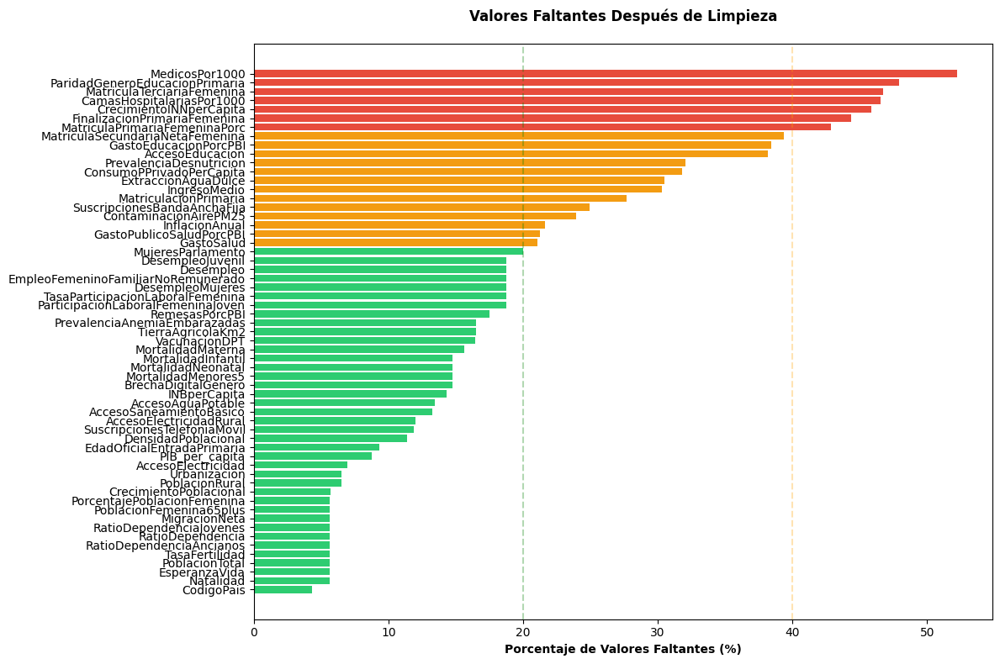


████████████████████████████████████████████████████████████████████████████████
ETAPA 3/7: ANÁLISIS DE NATALIDAD (UNIVARIADO Y BIVARIADO)
████████████████████████████████████████████████████████████████████████████████
ANÁLISIS DE NATALIDAD (UNIVARIADO Y BIVARIADO)

[1/3] Análisis univariado de Natalidad...

   Estadísticas de Natalidad:
      Media:    21.09
      Mediana:  18.17
      Std:      10.90
      Rango:    [4.40, 53.39]
      Asimetría: 0.75

[2/3] Calculando correlaciones con Natalidad...

   Top 15 variables más correlacionadas con Natalidad:

      TasaFertilidad                                  0.979  (positiva)
      RatioDependenciaJovenes                         0.974  (positiva)
      RatioDependencia                                0.890  (positiva)
      EsperanzaVida                                  -0.856  (negativa)
      MortalidadInfantil                              0.853  (positiva)
      AccesoSaneamientoBasico                        -0.849  (negativa)
  

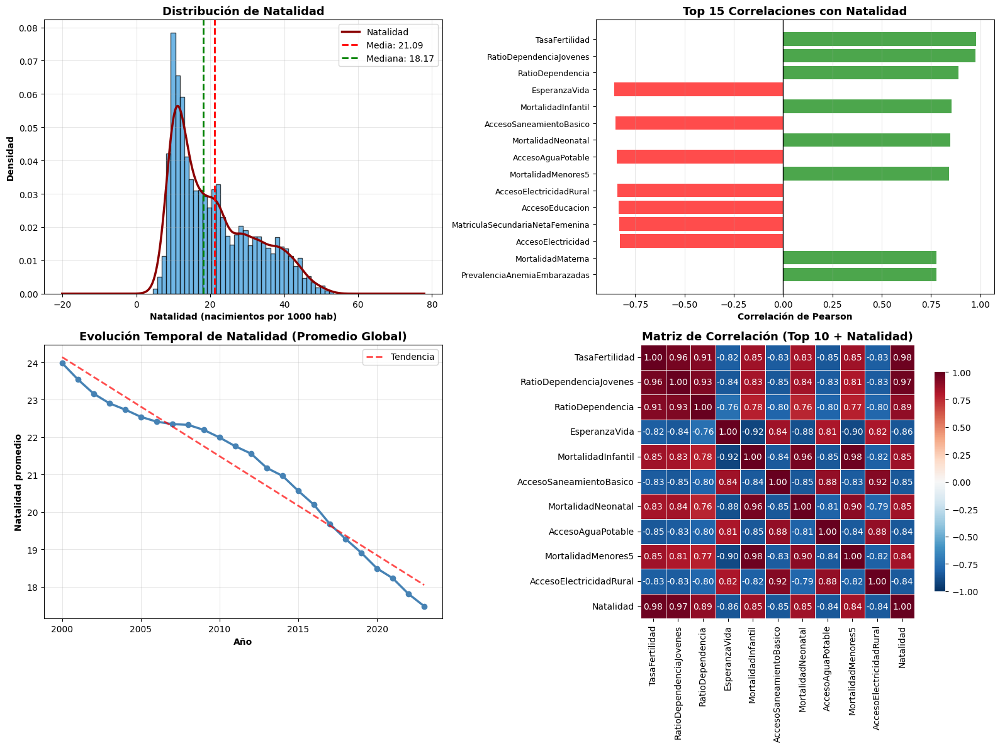


   ✓ Visualizaciones generadas

████████████████████████████████████████████████████████████████████████████████
ETAPA 4/7: ELIMINACIÓN DE DATA LEAKAGE
████████████████████████████████████████████████████████████████████████████████
ELIMINACIÓN DE DATA LEAKAGE

[1/3] Eliminando registros con Natalidad faltante...
   ✓ Registros eliminados: 312 (5.65%)
   ✓ Registros restantes: 5,208

[2/3] Eliminando variables con leakage directo...
   ✓ Variables con leakage directo eliminadas: 7

   Razones de eliminación:
      • TasaFertilidad                      → Es otra forma de medir natalidad (hijos por mujer)
      • MortalidadInfantil                  → Necesita nacimientos para calcularse (muertes/1000 nacidos)
      • MortalidadMenores5                  → Necesita nacimientos para calcularse
      • MortalidadNeonatal                  → Necesita nacimientos recientes
      • MortalidadMaterna                   → Depende del número de embarazos/partos
      • PrevalenciaAnemiaEmbarazadas 

In [8]:
# Ejecutar pipeline completo
X_train_prep, X_test_prep, y_train, y_test, pipeline_info = pipeline_preparacion_datos(
    ruta_archivo='/content/drive/MyDrive/Colab Notebooks/df_limpio.csv',
    umbral_faltantes=60,
    año_corte=2018,
    guardar_drive=True,
    mostrar_graficos=True
)

### VAMOS CON EL ENTRENAMIENTO DE MODELOS DE ML

Entrenaremos y evalúaremos múltiples modelos con Cross-Validation.
    
Modelos entrenados:
    - LinearRegression: Baseline simple
    - Ridge: Regresión con regularización L2
    - SVR: Support Vector Regression
    - RandomForest: Ensemble de árboles

In [9]:
def entrenar_modelos_con_cv(X_train, X_test, y_train, y_test,
                            cv_folds=5,
                            guardar_resultados=True,
                            ruta_drive='/content/drive/MyDrive/Colab Notebooks'):

    """
Parámetros
    X_train : np.ndarray o pd.DataFrame
        Features de entrenamiento (ya preprocesadas)
    X_test : np.ndarray o pd.DataFrame
        Features de prueba (ya preprocesadas)
    y_train : pd.Series o np.ndarray
        Target de entrenamiento
    y_test : pd.Series o np.ndarray
        Target de prueba
    cv_folds : int, default=5
        Número de folds para Cross-Validation
    guardar_resultados : bool, default=True
        Si True, guarda tabla de resultados en Drive
    ruta_drive : str
        Ruta base en Google Drive

Retorna
    resultados : dict
        Diccionario con métricas, pipelines y predicciones de cada modelo
    df_comparacion : pd.DataFrame
        Tabla comparativa de todos los modelos
    """
    from sklearn.linear_model import LinearRegression, Ridge
    from sklearn.svm import SVR
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import cross_val_score, cross_validate
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import os

    print("="*70)
    print("ENTRENAMIENTO DE MODELOS CON CROSS-VALIDATION")
    print("="*70)

    # === DEFINIR MODELOS ===
    print(f"\n[1/4] Configurando modelos...")

    modelos = {
        'LinearRegression': LinearRegression(),

        'Ridge': Ridge(
            alpha=2.0,
            random_state=42
        ),

        'SVR': SVR(
            kernel='rbf',
            C=5,
            gamma='scale'
        ),

        'RandomForest': RandomForestRegressor(
            n_estimators=500,
            max_depth=10,
            min_samples_split=20,
            min_samples_leaf=5,
            max_features='sqrt',
            bootstrap=True,
            random_state=42,
            n_jobs=-1
        )
    }

    print(f"\n   Modelos configurados: {len(modelos)}")
    for i, (nombre, modelo) in enumerate(modelos.items(), 1):
        print(f"      {i}. {nombre}")

    print(f"\n   Cross-Validation: {cv_folds} folds")
    print(f"   Total entrenamientos por modelo: {cv_folds}")

    # === ENTRENAR MODELOS CON CV ===
    print(f"\n[2/4] Entrenando modelos con Cross-Validation...")
    print("="*70)

    resultados = {}

    for nombre, modelo in modelos.items():
        print(f"\n   Entrenando {nombre}...")

        # ====== CROSS-VALIDATION ======
        print(f"      → Ejecutando {cv_folds}-Fold CV...")

        scoring = {
            'neg_rmse': 'neg_root_mean_squared_error',
            'neg_mae': 'neg_mean_absolute_error',
            'r2': 'r2'
        }

        cv_results = cross_validate(
            modelo,
            X_train,
            y_train,
            cv=cv_folds,
            scoring=scoring,
            n_jobs=-1,
            return_train_score=True
        )

        # Calcular estadísticas de CV
        cv_train_rmse_mean = -cv_results['train_neg_rmse'].mean()
        cv_train_rmse_std = cv_results['train_neg_rmse'].std()

        cv_test_rmse_mean = -cv_results['test_neg_rmse'].mean()
        cv_test_rmse_std = cv_results['test_neg_rmse'].std()

        cv_train_r2_mean = cv_results['train_r2'].mean()
        cv_test_r2_mean = cv_results['test_r2'].mean()

        print(f"      → CV Train RMSE: {cv_train_rmse_mean:.4f} (±{cv_train_rmse_std:.4f})")
        print(f"      → CV Test RMSE:  {cv_test_rmse_mean:.4f} (±{cv_test_rmse_std:.4f})")
        print(f"      → CV Test R²:    {cv_test_r2_mean:.4f}")

        # ====== ENTRENAR EN TODO EL TRAIN SET ======
        print(f"      → Entrenando modelo final...")
        modelo.fit(X_train, y_train)

        # Predicciones finales
        y_train_pred = modelo.predict(X_train)
        y_test_pred = modelo.predict(X_test)

        # Métricas finales
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        train_mae = mean_absolute_error(y_train, y_train_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)
        train_r2 = r2_score(y_train, y_train_pred)
        test_r2 = r2_score(y_test, y_test_pred)

        print(f"      → Final Train RMSE: {train_rmse:.4f}")
        print(f"      → Final Test RMSE:  {test_rmse:.4f}")
        print(f"      → Final Test R²:    {test_r2:.4f}")

        # Guardar resultados
        resultados[nombre] = {
            'modelo': modelo,
            # Métricas de CV
            'cv_train_rmse_mean': cv_train_rmse_mean,
            'cv_train_rmse_std': cv_train_rmse_std,
            'cv_test_rmse_mean': cv_test_rmse_mean,
            'cv_test_rmse_std': cv_test_rmse_std,
            'cv_train_r2_mean': cv_train_r2_mean,
            'cv_test_r2_mean': cv_test_r2_mean,
            # Métricas finales
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_mae': train_mae,
            'test_mae': test_mae,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'overfitting': test_rmse - train_rmse,
            # Predicciones
            'y_train_pred': y_train_pred,
            'y_test_pred': y_test_pred
        }

    # === TABLA COMPARATIVA ===
    print(f"\n[3/4] Generando tabla comparativa...")
    print("="*70)

    # Tabla con métricas de CV
    print("\n   RESULTADOS DE CROSS-VALIDATION:\n")

    df_cv = pd.DataFrame({
        'Modelo': list(resultados.keys()),
        'CV Train RMSE': [f"{resultados[m]['cv_train_rmse_mean']:.4f} (±{resultados[m]['cv_train_rmse_std']:.4f})"
                          for m in resultados.keys()],
        'CV Test RMSE': [f"{resultados[m]['cv_test_rmse_mean']:.4f} (±{resultados[m]['cv_test_rmse_std']:.4f})"
                         for m in resultados.keys()],
        'CV Test R²': [f"{resultados[m]['cv_test_r2_mean']:.4f}"
                       for m in resultados.keys()]
    })

    print(df_cv.to_string(index=False))

    # Tabla con modelo final
    print("\n\n   RESULTADOS DEL MODELO FINAL:\n")

    df_comparacion = pd.DataFrame({
        'Modelo': list(resultados.keys()),
        'Train RMSE': [resultados[m]['train_rmse'] for m in resultados.keys()],
        'Test RMSE': [resultados[m]['test_rmse'] for m in resultados.keys()],
        'Train R²': [resultados[m]['train_r2'] for m in resultados.keys()],
        'Test R²': [resultados[m]['test_r2'] for m in resultados.keys()],
        'Train MAE': [resultados[m]['train_mae'] for m in resultados.keys()],
        'Test MAE': [resultados[m]['test_mae'] for m in resultados.keys()],
        'Overfitting': [resultados[m]['overfitting'] for m in resultados.keys()]
    })

    # Ordenar por Test RMSE
    df_comparacion = df_comparacion.sort_values('Test RMSE')

    print(df_comparacion.to_string(index=False))

    # === IDENTIFICAR MEJOR MODELO ===
    mejor_modelo_nombre = df_comparacion.iloc[0]['Modelo']

    print(f"\n" + "="*70)
    print("MEJOR MODELO")
    print("="*70)
    print(f"\n    {mejor_modelo_nombre}")
    print(f"\n   Métricas de Cross-Validation:")
    print(f"      CV Test RMSE: {resultados[mejor_modelo_nombre]['cv_test_rmse_mean']:.4f} (±{resultados[mejor_modelo_nombre]['cv_test_rmse_std']:.4f})")
    print(f"      CV Test R²:   {resultados[mejor_modelo_nombre]['cv_test_r2_mean']:.4f}")
    print(f"\n   Métricas del Modelo Final:")
    print(f"      Test RMSE:    {resultados[mejor_modelo_nombre]['test_rmse']:.4f}")
    print(f"      Test R²:      {resultados[mejor_modelo_nombre]['test_r2']:.4f}")
    print(f"      Test MAE:     {resultados[mejor_modelo_nombre]['test_mae']:.4f}")
    print(f"      Overfitting:  {resultados[mejor_modelo_nombre]['overfitting']:.4f}")

    # === VISUALIZACIONES ===
    print(f"\n[4/4] Generando visualizaciones...")

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Gráfico 1: RMSE con barras de error (CV)
    modelos_nombres = list(resultados.keys())
    cv_test_means = [resultados[m]['cv_test_rmse_mean'] for m in modelos_nombres]
    cv_test_stds = [resultados[m]['cv_test_rmse_std'] for m in modelos_nombres]

    x_pos = np.arange(len(modelos_nombres))
    axes[0].bar(x_pos, cv_test_means, yerr=cv_test_stds,
                capsize=5, alpha=0.7, color='steelblue', edgecolor='black')
    axes[0].set_xticks(x_pos)
    axes[0].set_xticklabels(modelos_nombres, rotation=45, ha='right')
    axes[0].set_ylabel('RMSE', fontsize=11, fontweight='bold')
    axes[0].set_title(f'Cross-Validation RMSE ({cv_folds} folds)',
                      fontweight='bold', fontsize=12)
    axes[0].grid(axis='y', alpha=0.3)

    # Gráfico 2: Comparación Train vs Test RMSE
    train_rmse = [resultados[m]['train_rmse'] for m in modelos_nombres]
    test_rmse = [resultados[m]['test_rmse'] for m in modelos_nombres]

    width = 0.35
    axes[1].bar(x_pos - width/2, train_rmse, width, label='Train',
                color='lightgreen', alpha=0.7, edgecolor='black')
    axes[1].bar(x_pos + width/2, test_rmse, width, label='Test',
                color='coral', alpha=0.7, edgecolor='black')
    axes[1].set_xticks(x_pos)
    axes[1].set_xticklabels(modelos_nombres, rotation=45, ha='right')
    axes[1].set_ylabel('RMSE', fontsize=11, fontweight='bold')
    axes[1].set_title('Comparación Train vs Test RMSE',
                      fontweight='bold', fontsize=12)
    axes[1].legend()
    axes[1].grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("\n   ✓ Visualizaciones generadas")

    # === GUARDAR RESULTADOS ===
    if guardar_resultados:
        print(f"\n" + "="*70)
        print("GUARDANDO RESULTADOS EN DRIVE")
        print("="*70)

        carpeta = os.path.join(ruta_drive, 'resultados_modelos')
        os.makedirs(carpeta, exist_ok=True)

        # Guardar tabla comparativa
        ruta_csv = os.path.join(carpeta, 'comparacion_modelos.csv')
        df_comparacion.to_csv(ruta_csv, index=False)

        print(f"\n   ✓ Tabla comparativa guardada:")
        print(f"       {ruta_csv}")

    print("\n" + "="*70)

    return resultados, df_comparacion

ENTRENAMIENTO DE MODELOS CON CROSS-VALIDATION

[1/4] Configurando modelos...

   Modelos configurados: 4
      1. LinearRegression
      2. Ridge
      3. SVR
      4. RandomForest

   Cross-Validation: 10 folds
   Total entrenamientos por modelo: 10

[2/4] Entrenando modelos con Cross-Validation...

   Entrenando LinearRegression...
      → Ejecutando 10-Fold CV...
      → CV Train RMSE: 2.0314 (±0.0323)
      → CV Test RMSE:  2.2480 (±0.3098)
      → CV Test R²:    0.9555
      → Entrenando modelo final...
      → Final Train RMSE: 2.0424
      → Final Test RMSE:  2.4607
      → Final Test R²:    0.9354

   Entrenando Ridge...
      → Ejecutando 10-Fold CV...
      → CV Train RMSE: 2.0314 (±0.0323)
      → CV Test RMSE:  2.2472 (±0.3109)
      → CV Test R²:    0.9556
      → Entrenando modelo final...
      → Final Train RMSE: 2.0424
      → Final Test RMSE:  2.4601
      → Final Test R²:    0.9354

   Entrenando SVR...
      → Ejecutando 10-Fold CV...
      → CV Train RMSE: 1.2593 (

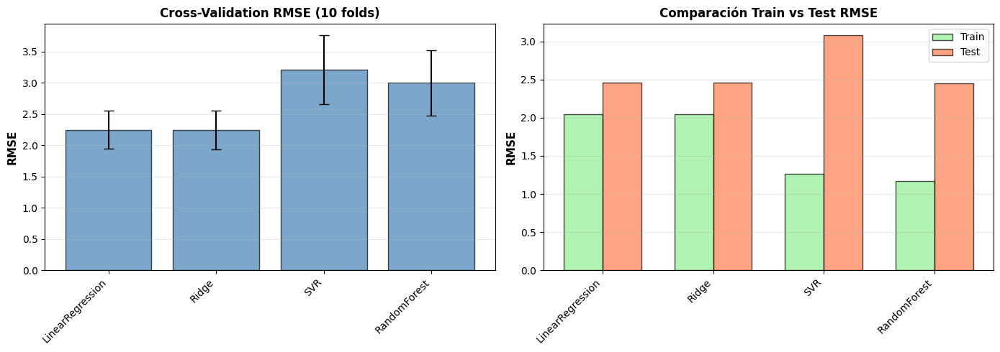


   ✓ Visualizaciones generadas

GUARDANDO RESULTADOS EN DRIVE

   ✓ Tabla comparativa guardada:
       /content/drive/MyDrive/Colab Notebooks/resultados_modelos/comparacion_modelos.csv



In [10]:
# Después de ejecutar el pipeline
resultados, df_comparacion = entrenar_modelos_con_cv(
    X_train_prep,
    X_test_prep,
    y_train,
    y_test,
    cv_folds=10,
    guardar_resultados=True
)

# Acceder al mejor modelo
mejor_modelo = resultados['Ridge']['modelo']  # O el que salga mejor

### OPTIMICEMOS EL MODELO GANADOR:
Optimizaremos los hiperparámetros de RandomForest usando GridSearch o RandomizedSearch.
    
Hiperparámetros a optimizar:
  - n_estimators: Número de árboles
  - max_depth: Profundidad máxima
  - min_samples_split: Mínimo de muestras para dividir
  - min_samples_leaf: Mínimo de muestras en hoja
  - max_features: Número de features por árbol

In [11]:
def optimizar_randomforest(X_train, y_train, X_test, y_test,
                           metodo='randomized',
                           cv_folds=10,
                           n_iter=10,
                           guardar_modelo=True,
                           ruta_drive='/content/drive/MyDrive/Colab Notebooks/'):

    """
Parámetros:
    X_train : np.ndarray
        Features de entrenamiento (preprocesadas)
    y_train : pd.Series o np.ndarray
        Target de entrenamiento
    X_test : np.ndarray
        Features de test (preprocesadas)
    y_test : pd.Series o np.ndarray
        Target de test
    metodo : str, default='randomized'
        Método de búsqueda: 'randomized' o 'grid'
    cv_folds : int, default=5
        Número de folds para CV
    n_iter : int, default=30
        Número de iteraciones (solo para RandomizedSearch)
    guardar_modelo : bool, default=True
        Si True, guarda el modelo optimizado
    ruta_drive : str
        Ruta base en Google Drive

Retorna
    best_model : RandomForestRegressor
        Modelo optimizado
    resultados_optimizacion : dict
        Información completa de la optimización

    """
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pickle
    import os
    import time

    print("="*70)
    print("OPTIMIZACIÓN DE RANDOMFOREST")
    print("="*70)

    # === 1. CONFIGURAR GRID DE HIPERPARÁMETROS ===
    print(f"\n[1/5] Configurando búsqueda de hiperparámetros...")
    print(f"   Método: {metodo.upper()}")

    # Grid de hiperparámetros
    #Reduciremos el rango de hiperparámetros para mejorar el search
    param_grid = {
        'n_estimators': [450, 500, 550],
        'max_depth': [19, 20, 21],
        'min_samples_split': [9, 10, 11],
        'min_samples_leaf': [2, 3, 4],
        'max_features': [0.4, 0.5, 0.6]
    }

    """
    MEJORES HIPERPARÁMETROS YA PROBADOS en 2da presentación:
            n_estimators=200,
            max_depth=15,
            min_samples_split=10,
            min_samples_leaf=4,
            max_features='sqrt',
            random_state=42,
            n_jobs=-1

     MEJORES HIPERPARÁMETROS PRIMERA OPTIMIZACIÓN:
      • n_estimators        : 500
      • min_samples_split   : 5
      • min_samples_leaf    : 2
      • max_features        : 0.5
      • max_depth           : 20

    """

    print(f"\n   Hiperparámetros a explorar:")
    for param, valores in param_grid.items():
        print(f"      • {param:<20}: {valores}")

    # Calcular combinaciones posibles
    total_combinaciones = np.prod([len(v) for v in param_grid.values()])
    print(f"\n   Total de combinaciones posibles: {total_combinaciones:,}")

    if metodo == 'randomized':
        print(f"   Iteraciones a probar: {n_iter}")
        print(f"   CV folds: {cv_folds}")
        print(f"   Total entrenamientos: {n_iter * cv_folds}")
    else:
        print(f"   CV folds: {cv_folds}")
        print(f"   Total entrenamientos: {total_combinaciones * cv_folds}")

    # === 2. BÚSQUEDA DE HIPERPARÁMETROS ===
    print(f"\n[2/5] Iniciando búsqueda de hiperparámetros...")
    print("="*70)

    # Modelo base
    rf_base = RandomForestRegressor(random_state=42, n_jobs=-1)

    inicio = time.time()

    if metodo == 'randomized':
        search = RandomizedSearchCV(
            rf_base,
            param_distributions=param_grid,
            n_iter=n_iter,
            cv=cv_folds,
            scoring='neg_root_mean_squared_error',
            n_jobs=-1,
            random_state=42,
            verbose=2,
            return_train_score=True
        )
    else:  # grid
        search = GridSearchCV(
            rf_base,
            param_grid=param_grid,
            cv=cv_folds,
            scoring='neg_root_mean_squared_error',
            n_jobs=-1,
            verbose=2,
            return_train_score=True
        )

    print(f"\n   Entrenando... (esto puede tardar varios minutos)\n")
    search.fit(X_train, y_train)

    tiempo_busqueda = time.time() - inicio

    print(f"\n   ✓ Búsqueda completada en {tiempo_busqueda/60:.2f} minutos")

    # === 3. RESULTADOS DE LA OPTIMIZACIÓN ===
    print(f"\n[3/5] Analizando resultados...")
    print("="*70)

    best_model = search.best_estimator_
    best_params = search.best_params_
    best_cv_score = -search.best_score_

    print(f"\n   MEJORES HIPERPARÁMETROS:")
    for param, valor in best_params.items():
        print(f"      • {param:<20}: {valor}")

    print(f"\n   MEJOR CV RMSE: {best_cv_score:.4f}")

    # === 4. EVALUAR MODELO OPTIMIZADO ===
    print(f"\n[4/5] Evaluando modelo optimizado...")

    # Predicciones
    y_train_pred = best_model.predict(X_train)
    y_test_pred = best_model.predict(X_test)

    # Métricas
    metricas_optimizado = {
        'train_rmse': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        'test_rmse': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        'train_mae': mean_absolute_error(y_train, y_train_pred),
        'test_mae': mean_absolute_error(y_test, y_test_pred),
        'train_r2': r2_score(y_train, y_train_pred),
        'test_r2': r2_score(y_test, y_test_pred)
    }

    overfitting = metricas_optimizado['test_rmse'] - metricas_optimizado['train_rmse']

    print(f"\n   MÉTRICAS DEL MODELO OPTIMIZADO:")
    print(f"\n   {'Métrica':<15} {'Train':<15} {'Test':<15}")
    print(f"   {'-'*45}")
    print(f"   {'RMSE':<15} {metricas_optimizado['train_rmse']:<15.4f} {metricas_optimizado['test_rmse']:<15.4f}")
    print(f"   {'MAE':<15} {metricas_optimizado['train_mae']:<15.4f} {metricas_optimizado['test_mae']:<15.4f}")
    print(f"   {'R²':<15} {metricas_optimizado['train_r2']:<15.4f} {metricas_optimizado['test_r2']:<15.4f}")
    print(f"\n   Overfitting: {overfitting:.4f}")

    # Comparación con modelo base
    print(f"\n   COMPARACIÓN CON MODELO BASE:")
    print(f"      Modelo Base    - Test RMSE: 2.4482, Test R²: 0.9361")
    print(f"      Modelo Optimiz - Test RMSE: {metricas_optimizado['test_rmse']:.4f}, Test R²: {metricas_optimizado['test_r2']:.4f}")

    mejora_rmse = ((2.4482 - metricas_optimizado['test_rmse']) / 2.4482) * 100
    mejora_r2 = ((metricas_optimizado['test_r2'] - 0.9361) / 0.9361) * 100

    if mejora_rmse > 0:
        print(f"      ✓ RMSE mejoró {mejora_rmse:.2f}%")
    else:
        print(f"       RMSE empeoró {abs(mejora_rmse):.2f}%")

    if mejora_r2 > 0:
        print(f"      ✓ R² mejoró {mejora_r2:.2f}%")
    else:
        print(f"       R² empeoró {abs(mejora_r2):.2f}%")

    # === 5. ANÁLISIS DE RESULTADOS DE LA BÚSQUEDA ===
    print(f"\n[5/5] Generando análisis y visualizaciones...")

    # DataFrame con resultados de todas las combinaciones
    cv_results = pd.DataFrame(search.cv_results_)
    cv_results['mean_test_rmse'] = -cv_results['mean_test_score']
    cv_results['mean_train_rmse'] = -cv_results['mean_train_score']

    # Top 10 mejores combinaciones
    print(f"\n   TOP 10 MEJORES COMBINACIONES:\n")

    top_10 = cv_results.nsmallest(10, 'mean_test_rmse')[
        ['mean_test_rmse', 'mean_train_rmse', 'std_test_score',
         'param_n_estimators', 'param_max_depth', 'param_min_samples_split']
    ].copy()

    top_10.columns = ['Test RMSE', 'Train RMSE', 'Std', 'n_estimators', 'max_depth', 'min_samples_split']
    print(top_10.to_string(index=False))

    # VISUALIZACIONES
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Gráfico 1: Predicciones vs Reales (Test)
    axes[0, 0].scatter(y_test, y_test_pred, alpha=0.6, s=30, color='steelblue', edgecolor='black')
    axes[0, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
                    'r--', lw=2, label='Predicción perfecta')
    axes[0, 0].set_xlabel('Natalidad Real', fontweight='bold', fontsize=11)
    axes[0, 0].set_ylabel('Natalidad Predicha', fontweight='bold', fontsize=11)
    axes[0, 0].set_title(f'RandomForest Optimizado: Real vs Predicho\nR² = {metricas_optimizado["test_r2"]:.4f}',
                         fontweight='bold', fontsize=12)
    axes[0, 0].legend()
    axes[0, 0].grid(alpha=0.3)

    # Gráfico 2: Distribución de Residuos (Test)
    residuos_test = y_test - y_test_pred
    axes[0, 1].hist(residuos_test, bins=30, color='green', alpha=0.7, edgecolor='black')
    axes[0, 1].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Residuo = 0')
    axes[0, 1].set_xlabel('Residuos (Real - Predicho)', fontweight='bold', fontsize=11)
    axes[0, 1].set_ylabel('Frecuencia', fontweight='bold', fontsize=11)
    axes[0, 1].set_title(f'Distribución de Residuos\nMedia = {residuos_test.mean():.4f}',
                         fontweight='bold', fontsize=12)
    axes[0, 1].legend()
    axes[0, 1].grid(alpha=0.3)

    # Gráfico 3: Feature Importance
    importances = best_model.feature_importances_
    indices = np.argsort(importances)[-20:]  # Top 20

    axes[1, 0].barh(range(20), importances[indices], color='forestgreen', alpha=0.7, edgecolor='black')
    axes[1, 0].set_yticks(range(20))
    axes[1, 0].set_yticklabels([f'Feature {i}' for i in indices], fontsize=9)
    axes[1, 0].set_xlabel('Importancia', fontweight='bold', fontsize=11)
    axes[1, 0].set_title('Top 20 Features Más Importantes', fontweight='bold', fontsize=12)
    axes[1, 0].grid(axis='x', alpha=0.3)

    # Gráfico 4: RMSE vs n_estimators
    if 'param_n_estimators' in cv_results.columns:
        grouped = cv_results.groupby('param_n_estimators')['mean_test_rmse'].agg(['mean', 'std'])

        axes[1, 1].errorbar(grouped.index.astype(int), grouped['mean'],
                           yerr=grouped['std'], marker='o', capsize=5,
                           linewidth=2, markersize=8, color='darkorange')
        axes[1, 1].set_xlabel('Número de Árboles (n_estimators)', fontweight='bold', fontsize=11)
        axes[1, 1].set_ylabel('CV Test RMSE', fontweight='bold', fontsize=11)
        axes[1, 1].set_title('Impacto del Número de Árboles', fontweight='bold', fontsize=12)
        axes[1, 1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("\n   ✓ Visualizaciones generadas")

    # === GUARDAR MODELO ===
    if guardar_modelo:
        print(f"\n" + "="*70)
        print("GUARDANDO MODELO OPTIMIZADO")
        print("="*70)

        carpeta = os.path.join(ruta_drive, 'modelos_entrenados')
        os.makedirs(carpeta, exist_ok=True)

        # Guardar modelo
        ruta_modelo = os.path.join(carpeta, 'random_forest_optimizado.pkl')
        with open(ruta_modelo, 'wb') as f:
            pickle.dump(best_model, f)

        tamaño_mb = os.path.getsize(ruta_modelo) / (1024 * 1024)

        print(f"\n   ✓ Modelo guardado exitosamente")
        print(f"       Ubicación: {ruta_modelo}")
        print(f"       Tamaño: {tamaño_mb:.2f} MB")

        # Guardar hiperparámetros
        ruta_params = os.path.join(carpeta, 'mejores_hiperparametros.txt')
        with open(ruta_params, 'w') as f:
            f.write("MEJORES HIPERPARÁMETROS - RANDOMFOREST\n")
            f.write("="*50 + "\n\n")
            for param, valor in best_params.items():
                f.write(f"{param}: {valor}\n")
            f.write(f"\nCV RMSE: {best_cv_score:.4f}\n")
            f.write(f"Test RMSE: {metricas_optimizado['test_rmse']:.4f}\n")
            f.write(f"Test R²: {metricas_optimizado['test_r2']:.4f}\n")

        print(f"       Hiperparámetros guardados: {ruta_params}")

    # === PREPARAR RESULTADOS ===
    resultados_optimizacion = {
        'best_model': best_model,
        'best_params': best_params,
        'best_cv_score': best_cv_score,
        'metricas': metricas_optimizado,
        'overfitting': overfitting,
        'cv_results': cv_results,
        'top_10_combinaciones': top_10,
        'tiempo_busqueda': tiempo_busqueda,
        'mejora_rmse': mejora_rmse,
        'mejora_r2': mejora_r2,
        'y_test_pred': y_test_pred,
        'feature_importances': importances,
        'ruta_modelo': os.path.join(carpeta, 'random_forest_optimizado.pkl') if guardar_modelo else None
    }

    print("\n" + "="*70)
    print("OPTIMIZACIÓN COMPLETADA")
    print("="*70)

    return best_model, resultados_optimizacion

OPTIMIZACIÓN DE RANDOMFOREST

[1/5] Configurando búsqueda de hiperparámetros...
   Método: RANDOMIZED

   Hiperparámetros a explorar:
      • n_estimators        : [450, 500, 550]
      • max_depth           : [19, 20, 21]
      • min_samples_split   : [9, 10, 11]
      • min_samples_leaf    : [2, 3, 4]
      • max_features        : [0.4, 0.5, 0.6]

   Total de combinaciones posibles: 243
   Iteraciones a probar: 5
   CV folds: 5
   Total entrenamientos: 25

[2/5] Iniciando búsqueda de hiperparámetros...

   Entrenando... (esto puede tardar varios minutos)

Fitting 5 folds for each of 5 candidates, totalling 25 fits

   ✓ Búsqueda completada en 12.37 minutos

[3/5] Analizando resultados...

   MEJORES HIPERPARÁMETROS:
      • n_estimators        : 550
      • min_samples_split   : 11
      • min_samples_leaf    : 3
      • max_features        : 0.6
      • max_depth           : 20

   MEJOR CV RMSE: 2.5585

[4/5] Evaluando modelo optimizado...

   MÉTRICAS DEL MODELO OPTIMIZADO:

   Mé

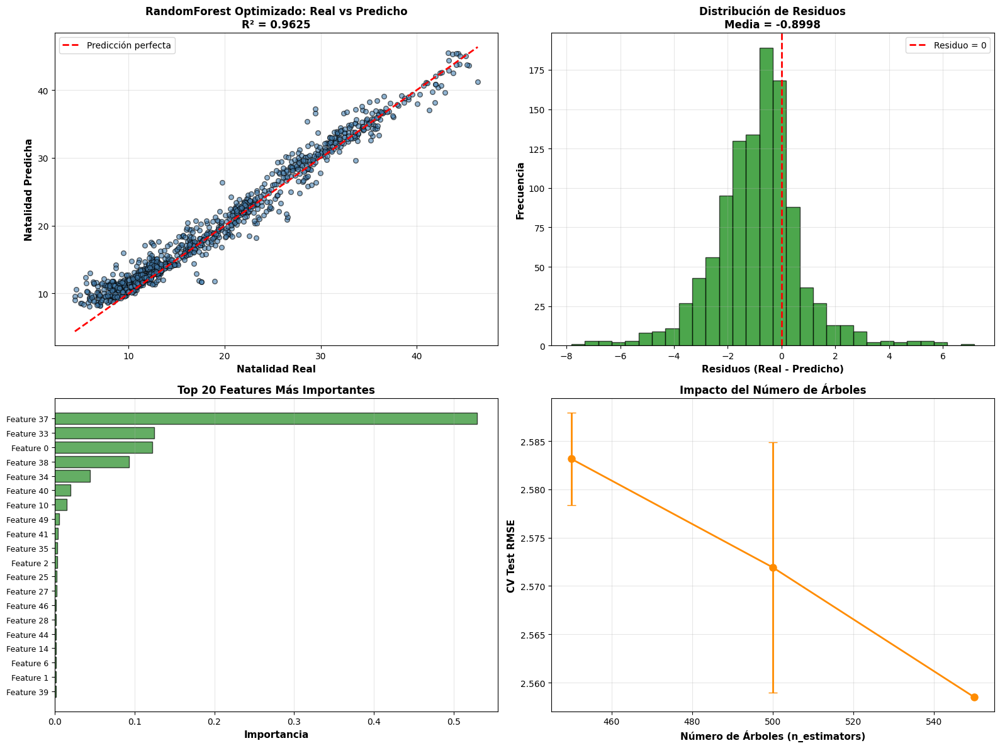


   ✓ Visualizaciones generadas

GUARDANDO MODELO OPTIMIZADO

   ✓ Modelo guardado exitosamente
       Ubicación: /content/drive/MyDrive/Colab Notebooks/modelos_entrenados/random_forest_optimizado.pkl
       Tamaño: 32.67 MB
       Hiperparámetros guardados: /content/drive/MyDrive/Colab Notebooks/modelos_entrenados/mejores_hiperparametros.txt

OPTIMIZACIÓN COMPLETADA


In [12]:
# Optimizar RandomForest
best_rf, resultados_opt = optimizar_randomforest(
    X_train_prep,
    y_train,
    X_test_prep,
    y_test,
    metodo='randomized',  # Más rápido
    cv_folds=5,
    n_iter=5,
    guardar_modelo=True
)

### Creamos una funcion auxiliar para crear los continentes y regiones asignando al continente y región a cada país del dataset.

*/*************************************************************************

In [13]:
def asignar_regiones(ruta_drive='/content/drive/MyDrive/', guardar_drive=True):
    """
    Carga el dataset desde Drive y asigna continente y región a cada país.

    Parámetros
    ----------
    ruta_drive : str, default='/content/drive/MyDrive/'
        Ruta base en Google Drive

    Retorna
    -------
    df_con_regiones : pd.DataFrame
        Dataset con columnas 'Continente' y 'Region' agregadas
    """
    import pandas as pd
    import os

    print("="*70)
    print("CARGA DE DATASET Y ASIGNACIÓN DE REGIONES GEOGRÁFICAS")
    print("="*70)

    # ========================================================================
    # PASO 1: CARGAR DATASET DESDE DRIVE
    # ========================================================================
    print("\n[1/2] Cargando dataset desde Drive...")

    carpeta = os.path.join(ruta_drive, 'datasets_natalidad')
    ruta_archivo = os.path.join(carpeta, 'df_con_features_temporales.csv')

    print(f"   📁 Ruta: {ruta_archivo}")

    if not os.path.exists(ruta_archivo):
        raise FileNotFoundError(f"❌ No se encontró el archivo: {ruta_archivo}")

    df = pd.read_csv(ruta_archivo)

    print(f"   ✓ Dataset cargado: {df.shape[0]:,} filas × {df.shape[1]} columnas")

    # ========================================================================
    # PASO 2: ASIGNAR REGIONES
    # ========================================================================
    print("\n[2/2] Asignando regiones geográficas...")

    # Diccionario de países por continente y región
    regiones_dict = {
        # AMÉRICA
        'United States': {'Continente': 'América', 'Region': 'América del Norte'},
        'Canada': {'Continente': 'América', 'Region': 'América del Norte'},
        'Mexico': {'Continente': 'América', 'Region': 'América del Norte'},
        'Bermuda': {'Continente': 'América', 'Region': 'América del Norte'},
        'Greenland': {'Continente': 'América', 'Region': 'América del Norte'},

        'Belize': {'Continente': 'América', 'Region': 'América Central'},
        'Costa Rica': {'Continente': 'América', 'Region': 'América Central'},
        'El Salvador': {'Continente': 'América', 'Region': 'América Central'},
        'Guatemala': {'Continente': 'América', 'Region': 'América Central'},
        'Honduras': {'Continente': 'América', 'Region': 'América Central'},
        'Nicaragua': {'Continente': 'América', 'Region': 'América Central'},
        'Panama': {'Continente': 'América', 'Region': 'América Central'},

        'Bahamas, The': {'Continente': 'América', 'Region': 'Caribe'},
        'Barbados': {'Continente': 'América', 'Region': 'Caribe'},
        'Cuba': {'Continente': 'América', 'Region': 'Caribe'},
        'Dominican Republic': {'Continente': 'América', 'Region': 'Caribe'},
        'Haiti': {'Continente': 'América', 'Region': 'Caribe'},
        'Jamaica': {'Continente': 'América', 'Region': 'Caribe'},
        'Trinidad and Tobago': {'Continente': 'América', 'Region': 'Caribe'},
        'Antigua and Barbuda': {'Continente': 'América', 'Region': 'Caribe'},
        'Aruba': {'Continente': 'América', 'Region': 'Caribe'},
        'British Virgin Islands': {'Continente': 'América', 'Region': 'Caribe'},
        'Cayman Islands': {'Continente': 'América', 'Region': 'Caribe'},
        'Curacao': {'Continente': 'América', 'Region': 'Caribe'},
        'Dominica': {'Continente': 'América', 'Region': 'Caribe'},
        'Grenada': {'Continente': 'América', 'Region': 'Caribe'},
        'Puerto Rico (US)': {'Continente': 'América', 'Region': 'Caribe'},
        'Sint Maarten (Dutch part)': {'Continente': 'América', 'Region': 'Caribe'},
        'St. Kitts and Nevis': {'Continente': 'América', 'Region': 'Caribe'},
        'St. Lucia': {'Continente': 'América', 'Region': 'Caribe'},
        'St. Martin (French part)': {'Continente': 'América', 'Region': 'Caribe'},
        'St. Vincent and the Grenadines': {'Continente': 'América', 'Region': 'Caribe'},
        'Turks and Caicos Islands': {'Continente': 'América', 'Region': 'Caribe'},
        'Virgin Islands (U.S.)': {'Continente': 'América', 'Region': 'Caribe'},

        'Argentina': {'Continente': 'América', 'Region': 'América del Sur'},
        'Bolivia': {'Continente': 'América', 'Region': 'América del Sur'},
        'Brazil': {'Continente': 'América', 'Region': 'América del Sur'},
        'Chile': {'Continente': 'América', 'Region': 'América del Sur'},
        'Colombia': {'Continente': 'América', 'Region': 'América del Sur'},
        'Ecuador': {'Continente': 'América', 'Region': 'América del Sur'},
        'Guyana': {'Continente': 'América', 'Region': 'América del Sur'},
        'Paraguay': {'Continente': 'América', 'Region': 'América del Sur'},
        'Peru': {'Continente': 'América', 'Region': 'América del Sur'},
        'Suriname': {'Continente': 'América', 'Region': 'América del Sur'},
        'Uruguay': {'Continente': 'América', 'Region': 'América del Sur'},
        'Venezuela, RB': {'Continente': 'América', 'Region': 'América del Sur'},

        # EUROPA
        'Albania': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Andorra': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Bosnia and Herzegovina': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Croatia': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Greece': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Italy': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Malta': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Montenegro': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'North Macedonia': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Portugal': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Serbia': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Slovenia': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Spain': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Gibraltar': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'Kosovo': {'Continente': 'Europa', 'Region': 'Europa del Sur'},
        'San Marino': {'Continente': 'Europa', 'Region': 'Europa del Sur'},

        'Austria': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Belgium': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'France': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Germany': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Liechtenstein': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Luxembourg': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Monaco': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Netherlands': {'Continente': 'Europa', 'Region': 'Europa Occidental'},
        'Switzerland': {'Continente': 'Europa', 'Region': 'Europa Occidental'},

        'Denmark': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Estonia': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Finland': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Iceland': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Ireland': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Latvia': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Lithuania': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Norway': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Sweden': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'United Kingdom': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Channel Islands': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Faroe Islands': {'Continente': 'Europa', 'Region': 'Europa del Norte'},
        'Isle of Man': {'Continente': 'Europa', 'Region': 'Europa del Norte'},

        'Belarus': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Bulgaria': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Czechia': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Hungary': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Moldova': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Poland': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Romania': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Russian Federation': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Slovak Republic': {'Continente': 'Europa', 'Region': 'Europa del Este'},
        'Ukraine': {'Continente': 'Europa', 'Region': 'Europa del Este'},

        # ASIA
        'Afghanistan': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Bangladesh': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Bhutan': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'India': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Iran, Islamic Rep.': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Maldives': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Nepal': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Pakistan': {'Continente': 'Asia', 'Region': 'Asia del Sur'},
        'Sri Lanka': {'Continente': 'Asia', 'Region': 'Asia del Sur'},

        'China': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Hong Kong SAR, China': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Japan': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Korea, Rep.': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Mongolia': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Korea, Dem. People\'s Rep.': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Macao SAR, China': {'Continente': 'Asia', 'Region': 'Asia Oriental'},
        'Taiwan': {'Continente': 'Asia', 'Region': 'Asia Oriental'}, # Asumiendo que 'Taiwan' estaba en el dataset original

        'Brunei Darussalam': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Cambodia': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Indonesia': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Lao PDR': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Malaysia': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Myanmar': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Philippines': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Singapore': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Thailand': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Timor-Leste': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},
        'Viet Nam': {'Continente': 'Asia', 'Region': 'Sudeste Asiático'},

        'Armenia': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Azerbaijan': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Bahrain': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Cyprus': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Georgia': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Iraq': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Israel': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Jordan': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Kuwait': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Lebanon': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Oman': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Qatar': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Saudi Arabia': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Syrian Arab Republic': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Turkiye': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'United Arab Emirates': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'Yemen, Rep.': {'Continente': 'Asia', 'Region': 'Asia Occidental'},
        'West Bank and Gaza': {'Continente': 'Asia', 'Region': 'Asia Occidental'},

        'Kazakhstan': {'Continente': 'Asia', 'Region': 'Asia Central'},
        'Kyrgyz Republic': {'Continente': 'Asia', 'Region': 'Asia Central'},
        'Tajikistan': {'Continente': 'Asia', 'Region': 'Asia Central'},
        'Turkmenistan': {'Continente': 'Asia', 'Region': 'Asia Central'},
        'Uzbekistan': {'Continente': 'Asia', 'Region': 'Asia Central'},

        # ÁFRICA
        'Algeria': {'Continente': 'África', 'Region': 'África del Norte'},
        'Egypt, Arab Rep.': {'Continente': 'África', 'Region': 'África del Norte'},
        'Libya': {'Continente': 'África', 'Region': 'África del Norte'},
        'Morocco': {'Continente': 'África', 'Region': 'África del Norte'},
        'Sudan': {'Continente': 'África', 'Region': 'África del Norte'},
        'Tunisia': {'Continente': 'África', 'Region': 'África del Norte'},

        'Benin': {'Continente': 'África', 'Region': 'África Occidental'},
        'Burkina Faso': {'Continente': 'África', 'Region': 'África Occidental'},
        'Cabo Verde': {'Continente': 'África', 'Region': 'África Occidental'},
        'Cameroon': {'Continente': 'África', 'Region': 'África Occidental'},
        'Chad': {'Continente': 'África', 'Region': 'África Occidental'},
        'Gambia, The': {'Continente': 'África', 'Region': 'África Occidental'},
        'Ghana': {'Continente': 'África', 'Region': 'África Occidental'},
        'Guinea': {'Continente': 'África', 'Region': 'África Occidental'},
        'Guinea-Bissau': {'Continente': 'África', 'Region': 'África Occidental'},
        'Cote d\'Ivoire': {'Continente': 'África', 'Region': 'África Occidental'},
        'Liberia': {'Continente': 'África', 'Region': 'África Occidental'},
        'Mali': {'Continente': 'África', 'Region': 'África Occidental'},
        'Mauritania': {'Continente': 'África', 'Region': 'África Occidental'},
        'Niger': {'Continente': 'África', 'Region': 'África Occidental'},
        'Nigeria': {'Continente': 'África', 'Region': 'África Occidental'},
        'Senegal': {'Continente': 'África', 'Region': 'África Occidental'},
        'Sierra Leone': {'Continente': 'África', 'Region': 'África Occidental'},
        'Togo': {'Continente': 'África', 'Region': 'África Occidental'},

        'Angola': {'Continente': 'África', 'Region': 'África del Sur'},
        'Botswana': {'Continente': 'África', 'Region': 'África del Sur'},
        'Comoros': {'Continente': 'África', 'Region': 'África del Sur'},
        'Eswatini': {'Continente': 'África', 'Region': 'África del Sur'},
        'Lesotho': {'Continente': 'África', 'Region': 'África del Sur'},
        'Madagascar': {'Continente': 'África', 'Region': 'África del Sur'},
        'Malawi': {'Continente': 'África', 'Region': 'África del Sur'},
        'Mauritius': {'Continente': 'África', 'Region': 'África del Sur'},
        'Mozambique': {'Continente': 'África', 'Region': 'África del Sur'},
        'Namibia': {'Continente': 'África', 'Region': 'África del Sur'},
        'Seychelles': {'Continente': 'África', 'Region': 'África del Sur'},
        'South Africa': {'Continente': 'África', 'Region': 'África del Sur'},
        'Zambia': {'Continente': 'África', 'Region': 'África del Sur'},
        'Zimbabwe': {'Continente': 'África', 'Region': 'África del Sur'},

        'Burundi': {'Continente': 'África', 'Region': 'África Oriental'},
        'Djibouti': {'Continente': 'África', 'Region': 'África Oriental'},
        'Eritrea': {'Continente': 'África', 'Region': 'África Oriental'},
        'Ethiopia': {'Continente': 'África', 'Region': 'África Oriental'},
        'Kenya': {'Continente': 'África', 'Region': 'África Oriental'},
        'Rwanda': {'Continente': 'África', 'Region': 'África Oriental'},
        'Somalia': {'Continente': 'África', 'Region': 'África Oriental'},
        'South Sudan': {'Continente': 'África', 'Region': 'África Oriental'},
        'Tanzania': {'Continente': 'África', 'Region': 'África Oriental'},
        'Uganda': {'Continente': 'África', 'Region': 'África Oriental'},

        'Central African Republic': {'Continente': 'África', 'Region': 'África Central'},
        'Congo, Rep.': {'Continente': 'África', 'Region': 'África Central'},
        'Congo, Dem. Rep.': {'Continente': 'África', 'Region': 'África Central'},
        'Equatorial Guinea': {'Continente': 'África', 'Region': 'África Central'},
        'Gabon': {'Continente': 'África', 'Region': 'África Central'},
        'Sao Tome and Principe': {'Continente': 'África', 'Region': 'África Central'},

        # OCEANÍA
        'Australia': {'Continente': 'Oceanía', 'Region': 'Australia y Nueva Zelanda'},
        'New Zealand': {'Continente': 'Oceanía', 'Region': 'Australia y Nueva Zelanda'},

        'Fiji': {'Continente': 'Oceanía', 'Region': 'Melanesia'},
        'Papua New Guinea': {'Continente': 'Oceanía', 'Region': 'Melanesia'},
        'Solomon Islands': {'Continente': 'Oceanía', 'Region': 'Melanesia'},
        'Vanuatu': {'Continente': 'Oceanía', 'Region': 'Melanesia'},
        'New Caledonia': {'Continente': 'Oceanía', 'Region': 'Melanesia'},

        'Kiribati': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Marshall Islands': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Micronesia, Fed. Sts.': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Nauru': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Palau': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Guam': {'Continente': 'Oceanía', 'Region': 'Micronesia'},
        'Northern Mariana Islands': {'Continente': 'Oceanía', 'Region': 'Micronesia'},

        'Samoa': {'Continente': 'Oceanía', 'Region': 'Polinesia'},
        'Tonga': {'Continente': 'Oceanía', 'Region': 'Polinesia'},
        'Tuvalu': {'Continente': 'Oceanía', 'Region': 'Polinesia'},
        'American Samoa': {'Continente': 'Oceanía', 'Region': 'Polinesia'},
        'French Polynesia': {'Continente': 'Oceanía', 'Region': 'Polinesia'},
    }

    df_con_regiones = df.copy()

    # Asignar continente y región
    df_con_regiones['Continente'] = df_con_regiones['Pais'].map(
        lambda x: regiones_dict.get(x, {}).get('Continente', 'Sin clasificar')
    )
    df_con_regiones['Region'] = df_con_regiones['Pais'].map(
        lambda x: regiones_dict.get(x, {}).get('Region', 'Sin clasificar')
    )

    # Estadísticas
    print(f"\n   ✓ Regiones asignadas")
    print(f"\n   Distribución por continente:")
    dist_continente = df_con_regiones['Continente'].value_counts()
    for cont, count in dist_continente.items():
        print(f"      • {cont:<20}: {count:>6,} registros")

    sin_clasificar = (df_con_regiones['Continente'] == 'Sin clasificar').sum()
    if sin_clasificar > 0:
        print(f"\n   ⚠ Países sin clasificar: {sin_clasificar}")
        paises_sin_clasificar = df_con_regiones[
            df_con_regiones['Continente'] == 'Sin clasificar'
        ]['Pais'].unique()
        print(f"      {list(paises_sin_clasificar)[:10]}")

    print("\n" + "="*70)

    # === GUARDAR EN DRIVE ===
    if guardar_drive:
        print("\n" + "="*70)
        print("GUARDANDO DATASET EN GOOGLE DRIVE")
        print("="*70)

        # Crear carpeta si no existe
        carpeta = os.path.join(ruta_drive, 'datasets_natalidad')
        os.makedirs(carpeta, exist_ok=True)

        # Ruta del archivo
        ruta_archivo = os.path.join(carpeta, 'df_con_regiones.csv')

        # Guardar
        df_con_regiones.to_csv(ruta_archivo, index=False)

        # Tamaño del archivo
        tamaño_mb = os.path.getsize(ruta_archivo) / (1024 * 1024)

        print(f"\n   ✓ Dataset guardado exitosamente")
        print(f"    Ubicación: {ruta_archivo}")
        print(f"    Tamaño: {tamaño_mb:.2f} MB")
        print(f"    Dimensiones: {df_con_regiones.shape[0]:,} × {df_con_regiones.shape[1]}")

    return df_con_regiones

In [14]:
# Llamar a la función y guardar el resultado en un DataFrame
df_con_regiones = asignar_regiones(
    ruta_drive='/content/drive/MyDrive/Colab Notebooks/'
)

# Mostrar las primeras filas para confirmar que se agregaron las columnas
df_con_regiones.head()


CARGA DE DATASET Y ASIGNACIÓN DE REGIONES GEOGRÁFICAS

[1/2] Cargando dataset desde Drive...
   📁 Ruta: /content/drive/MyDrive/Colab Notebooks/datasets_natalidad/df_con_features_temporales.csv
   ✓ Dataset cargado: 5,208 filas × 58 columnas

[2/2] Asignando regiones geográficas...

   ✓ Regiones asignadas

   Distribución por continente:
      • África              :  1,296 registros
      • Asia                :  1,200 registros
      • Europa              :  1,152 registros
      • América             :  1,104 registros
      • Oceanía             :    456 registros


GUARDANDO DATASET EN GOOGLE DRIVE

   ✓ Dataset guardado exitosamente
    Ubicación: /content/drive/MyDrive/Colab Notebooks/datasets_natalidad/df_con_regiones.csv
    Tamaño: 2.69 MB
    Dimensiones: 5,208 × 60


,Año,Pais,CodigoPais,Natalidad,EsperanzaVida,PoblacionTotal,PIB_per_capita,IngresoMedio,AccesoEducacion,Desempleo,...,TierraAgricolaKm2,ContaminacionAirePM25,ExtraccionAguaDulce,SuscripcionesBandaAnchaFija,AñosDesde2000,Decada,CrisisEconomica2008,PandemiaCOVID,Continente,Region
0,2023,Afghanistan,AF,35.437,66.035,41454761.0,413.757895,NaN,NaN,13.991,...,NaN,NaN,NaN,0.080087,23,2020,0,0,Asia,Asia del Sur
1,2022,Afghanistan,AF,36.045,65.617,40578842.0,357.261153,NaN,NaN,14.100,...,NaN,NaN,NaN,0.079630,22,2020,0,1,Asia,Asia del Sur
2,2021,Afghanistan,AF,36.342,60.417,40000412.0,356.496214,340.523244,NaN,11.994,...,383130.0,NaN,20.282,0.066424,21,2020,0,1,Asia,Asia del Sur
3,2020,Afghanistan,AF,36.601,61.454,39068979.0,510.787063,475.718084,NaN,11.710,...,383130.0,46.087094,20.282,0.068008,20,2020,0,1,Asia,Asia del Sur
4,2019,Afghanistan,AF,37.138,62.941,37856121.0,496.602504,468.403506,NaN,11.185,...,380100.0,58.330872,20.282,0.051994,19,2010,0,0,Asia,Asia del Sur


  Creamos una visualización interactiva de evolución temporal de natalidad por región.
    
  Características:
  - Líneas temporales por región
  - Selector interactivo de continente
  - Tooltips con información detallada
  - Highlight al pasar el mouse

In [15]:
def visualizacion_evolucion_temporal(df, guardar_html=False, ruta_guardado=None):
    """
    Crea visualización interactiva de evolución temporal de natalidad por región.
    ... (docstring sin cambios) ...
    """
    import altair as alt
    import pandas as pd

    print("="*70)
    print("VISUALIZACIÓN 1: EVOLUCIÓN TEMPORAL DE NATALIDAD POR REGIÓN")
    print("="*70)

    # Verificar que tiene las columnas necesarias
    columnas_necesarias = ['Año', 'Natalidad', 'Continente', 'Region']
    for col in columnas_necesarias:
        if col not in df.columns:
            raise KeyError(f"El dataset no contiene la columna '{col}'")

    # Preparar datos: Calcular promedio de natalidad por Año y Región
    print("\n[1/3] Preparando datos...")

    # Este 'seguro' elimina cualquier fila con valores nulos (NaN)
    # en las columnas 'Continente' o 'Region'.
    df_limpio = df.dropna(subset=['Continente', 'Region'])
    print(f"   ✓ Registros originales: {len(df):,}")
    print(f"   ✓ Registros después de limpiar nulos: {len(df_limpio):,}")

    # Ahora, todas las operaciones siguientes usan 'df_limpio'
    datos_agregados = df_limpio.groupby(['Año', 'Continente', 'Region']).agg({
        'Natalidad': 'mean',
        'Pais': 'count'  # Contar países por región
    }).reset_index()

    datos_agregados.columns = ['Año', 'Continente', 'Region', 'Natalidad_Promedio', 'Num_Paises']
    datos_agregados['Natalidad_Promedio'] = datos_agregados['Natalidad_Promedio'].round(2)

    num_continentes = datos_agregados['Continente'].nunique()
    print(f"   ✓ Datos agregados: {len(datos_agregados)} registros")
    print(f"   ✓ Continentes (para el gráfico): {num_continentes}")
    print(f"   ✓ Regiones: {datos_agregados['Region'].nunique()}")
    print(f"   ✓ Rango temporal: {datos_agregados['Año'].min()} - {datos_agregados['Año'].max()}")

    # Crear selector de continente
    print("\n[2/3] Creando visualización interactiva...")

    # Selector dropdown para continente
   # Selector dropdown para continente
    selector_continente = alt.selection_point(
        fields=['Continente'],
        bind=alt.binding_select(
            options=[None] + sorted(list(datos_agregados['Continente'].unique())),
            labels=['Todos'] + sorted(list(datos_agregados['Continente'].unique())),
            name='Filtrar por Continente: '
    ),
    value='América'  # Valor inicial
)

    # Selector para highlight de LÍNEA (por Región)
    hover_region_selection = alt.selection_point(
        fields=['Region'], # Selecciona por REGIÓN
        on='mouseover',
        nearest=True,
        empty=False
    )

    # Selector para highlight de PUNTO (para el texto)
    hover_point_selection = alt.selection_point(
        on='mouseover',    # No tiene 'fields', selecciona el PUNTO individual
        nearest=True,
        empty=False
    )

    # Gráfico base: líneas por región
    base = alt.Chart(datos_agregados).mark_line(
        strokeWidth=2.5
    ).encode(
        x=alt.X('Año:O',
                axis=alt.Axis(
                    title='Año',
                    labelAngle=-45,
                    titleFontSize=14,
                    titleFontWeight='bold',
                    labelFontSize=11
                )),
        y=alt.Y('Natalidad_Promedio:Q',
                axis=alt.Axis(
                    title='Natalidad Promedio (nacimientos por 1000 hab)',
                    titleFontSize=14,
                    titleFontWeight='bold',
                    labelFontSize=11
                ),
                scale=alt.Scale(zero=False)),

        # El color siempre es por Continente
        color=alt.Color('Continente:N',
                      legend=alt.Legend(
                          title='Continente',
                          titleFontSize=13,
                          titleFontWeight='bold',
                          labelFontSize=11
                      )),
        detail='Region:N',

        # La opacidad de la LÍNEA reacciona a la selección de REGIÓN
        opacity=alt.condition(hover_region_selection, alt.value(1), alt.value(0.1)),

        tooltip=[
            alt.Tooltip('Region:N', title='Región'),
            alt.Tooltip('Continente:N', title='Continente'),
            alt.Tooltip('Año:O', title='Año'),
            alt.Tooltip('Natalidad_Promedio:Q', title='Natalidad Promedio', format='.2f'),
            alt.Tooltip('Num_Paises:Q', title='Número de Países')
        ]
    ).transform_filter(
        selector_continente
    )

    # Puntos más grandes para mejor interactividad
    points = base.mark_circle(size=60).add_params(
        hover_region_selection,  # Esta capa controla AMBAS selecciones
        hover_point_selection
    )

    # Línea de tendencia global
    tendencia_global = alt.Chart(datos_agregados).mark_line(
        strokeDash=[5, 5],
        strokeWidth=3,
        color='red',
        opacity=0.6
    ).encode(
        x='Año:O',
        y='mean(Natalidad_Promedio):Q'
    ).transform_filter(
        selector_continente
    )

    # Texto con la región al pasar mouse
    text_region = base.mark_text( # Hereda de 'base' para tener todos los puntos
        align='left',
        dx=5,
        dy=-10,
        fontSize=12,
        fontWeight='bold'
    ).encode(
        text='Region:N',
        color=alt.value('black'),

        # La opacidad del TEXTO reacciona a la selección del PUNTO
        opacity=alt.condition(hover_point_selection, alt.value(1), alt.value(0))
    )

    # Combinar capas
    chart = (base + points + tendencia_global + text_region).add_params(
        selector_continente # El selector global se añade al final
    ).properties(
        width=1080,
        height=720,
        title={
            'text': 'Evolución Temporal de la Natalidad por Región Geográfica',
            'subtitle': [
                'Promedio de nacimientos por 1000 habitantes | Interactivo: Selecciona continente y pasa el mouse sobre las líneas',
                'Línea roja punteada: Tendencia promedio del continente seleccionado'
            ],
            'fontSize': 18,
            'fontWeight': 'bold',
            'anchor': 'start',
            'subtitleFontSize': 12,
            'subtitleColor': 'gray'
        }
    ).configure_axis(
        gridColor='lightgray',
        gridOpacity=0.5
    ).configure_view(
        strokeWidth=0
    )

    print("   ✓ Visualización creada exitosamente")

    # ... (Guardado de HTML y prints finales sin cambios) ...
    if guardar_html:
        print("\n[3/3] Guardando visualización...")
        if ruta_guardado is None:
            ruta_guardado = 'visualizacion_evolucion_temporal.html'
        chart.save(ruta_guardado)
        import os
        tamaño_kb = os.path.getsize(ruta_guardado) / 1024
        print(f"   ✓ HTML guardado exitosamente")
        print(f"        Ubicación: {ruta_guardado}")
        print(f"        Tamaño: {tamaño_kb:.2f} KB")
    else:
        print("\n[3/3] Visualización lista para mostrar")
    print("\n" + "="*70)
    print("CARACTERÍSTICAS DE LA VISUALIZACIÓN:")
    print("="*70)
    print("   ✓ Selector de continente (dropdown)")
    print("   ✓ Highlight al pasar mouse sobre regiones")
    print("   ✓ Tooltips con información detallada")
    print("   ✓ Línea de tendencia promedio (roja punteada)")
    print("   ✓ Escala de colores por continente")
    print("   ✓ Puntos interactivos en cada año")
    print("="*70 + "\n")

    return chart

In [16]:
chart1 = visualizacion_evolucion_temporal(
    df=df_con_regiones,
    guardar_html=True,
    ruta_guardado='/content/drive/MyDrive/Colab Notebooks/datasets_natalidad/visualizacion_evolucion.html'
)

chart1   # Para mostrarlo en pantalla


VISUALIZACIÓN 1: EVOLUCIÓN TEMPORAL DE NATALIDAD POR REGIÓN

[1/3] Preparando datos...
   ✓ Registros originales: 5,208
   ✓ Registros después de limpiar nulos: 5,208
   ✓ Datos agregados: 528 registros
   ✓ Continentes (para el gráfico): 5
   ✓ Regiones: 22
   ✓ Rango temporal: 2000 - 2023

[2/3] Creando visualización interactiva...
   ✓ Visualización creada exitosamente

[3/3] Guardando visualización...
   ✓ HTML guardado exitosamente
        Ubicación: /content/drive/MyDrive/Colab Notebooks/datasets_natalidad/visualizacion_evolucion.html
        Tamaño: 70.01 KB

CARACTERÍSTICAS DE LA VISUALIZACIÓN:
   ✓ Selector de continente (dropdown)
   ✓ Highlight al pasar mouse sobre regiones
   ✓ Tooltips con información detallada
   ✓ Línea de tendencia promedio (roja punteada)
   ✓ Escala de colores por continente
   ✓ Puntos interactivos en cada año



alt.LayerChart(...)

In [17]:
!pip install vegafusion vegafusion-python-embed

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.8/23.8 MB 83.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.1/25.1 MB 79.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 98.6 MB/s eta 0:00:00


In [18]:
!pip install "vl-convert-python>=1.6.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.0/33.0 MB 11.2 MB/s eta 0:00:00


In [19]:
import altair as alt

# Habilita el transformador de datos VegaFusion
alt.data_transformers.enable('vegafusion')

DataTransformerRegistry.enable('vegafusion')

### Crearemos un  scatter plot interactivo para explorar correlaciones con Natalidad pero por regiones

In [20]:
def visualizacion_correlaciones_interactiva(ruta_drive='/content/drive/MyDrive/Colab Notebooks/',
                                          guardar_html=False,
                                          ruta_guardado=None):
    import altair as alt
    import pandas as pd
    import numpy as np
    import os

    print("="*70)
    print("VISUALIZACIÓN 2: CORRELACIONES INTERACTIVAS CON NATALIDAD")
    print("="*70)

    # PASO 1: CARGAR DATASET CON REGIONES
    print("\n[1/4] Cargando dataset con regiones...")
    df_con_regiones = asignar_regiones(ruta_drive)

    # PASO 2: SELECCIONAR VARIABLES SOCIOECONÓMICAS CLAVE
    print("\n[2/4] Seleccionando variables para análisis...")
    # (Definición de variables_analisis ... sin cambios)

    variables_analisis = {
        'EsperanzaVida': 'Esperanza de Vida (años)',
        'PoblacionTotal': 'Población Total',
        'PIB_per_capita': 'PIB per cápita (USD)',
        'IngresoMedio': 'Ingreso Medio (USD)',
        'AccesoEducacion': 'Acceso a Educación (%)',
        'Desempleo': 'Desempleo (%)',
        'Urbanizacion': 'Urbanización (%)',
        'GastoSalud': 'Gasto en Salud (% PIB)',
        'MatriculacionPrimaria': 'Matriculación Primaria (%)',
        'MujeresParlamento': 'Mujeres en Parlamento (%)',
        'AccesoAguaPotable': 'Acceso a Agua Potable (%)',
        'PrevalenciaDesnutricion': 'Desnutrición (%)',
        'BrechaDigitalGenero': 'Brecha Digital de Género',
        'VacunacionDPT': 'Vacunación DPT (%)',
        'CamasHospitalariasPor1000': 'Camas de Hospital (por 1000 hab)',
        'MedicosPor1000': 'Médicos (por 1000 hab)',
        'MatriculaSecundariaNetaFemenina': 'Matrícula Secundaria Femenina (%)',
        'FinalizacionPrimariaFemenina': 'Finalización Primaria Femenina (%)',
        'MatriculaTerciariaFemenina': 'Matrícula Terciaria Femenina (%)',
        'GastoEducacionPorcPBI': 'Gasto en Educación (% PIB)',
        'MatriculaPrimariaFemeninaPorc': 'Matrícula Primaria Femenina (%)',
        'ParidadGeneroEducacionPrimaria': 'Paridad Género (Ed. Primaria)',
        'EdadOficialEntradaPrimaria': 'Edad Oficial (Ed. Primaria)',
        'DesempleoJuvenil': 'Desempleo Juvenil (%)',
        'DesempleoMujeres': 'Desempleo Femenino (%)',
        'TasaParticipacionLaboralFemenina': 'Participación Laboral Femenina (%)',
        'EmpleoFemeninoFamiliarNoRemunerado': 'Empleo Femenino No Remunerado (%)',
        'ParticipacionLaboralFemeninaJoven': 'Participación Laboral Femenina Joven (%)',
        'INBperCapita': 'Ingreso Nacional Bruto per cápita',
        'InflacionAnual': 'Inflación Anual (%)',
        'RemesasPorcPBI': 'Remesas (% PIB)',
        'CrecimientoINNperCapita': 'Crecimiento Ingreso Bruto per cápita (%)',
        'ConsumoPPrivadoPerCapita': 'Consumo Privado per cápita',
        'AccesoSaneamientoBasico': 'Acceso Saneamiento Básico (%)',
        'AccesoElectricidad': 'Acceso a Electricidad (%)',
        'AccesoElectricidadRural': 'Acceso a Electricidad Rural (%)',
        'SuscripcionesTelefoniaMovil': 'Suscripciones Móviles (por 100 hab)',
        'RatioDependencia': 'Ratio de Dependencia (%)',
        'RatioDependenciaAncianos': 'Ratio de Dependencia (Ancianos, %)',
        'PoblacionRural': 'Población Rural (%)',
        'CrecimientoPoblacional': 'Crecimiento Poblacional (%)',
        'DensidadPoblacional': 'Densidad Poblacional',
        'MigracionNeta': 'Migración Neta',
        'PoblacionFemenina65plus': 'Pobl. Femenina 65+ (%)',
        'PorcentajePoblacionFemenina': 'Población Femenina (%)',
        'GastoPublicoSaludPorcPBI': 'Gasto Público en Salud (% PIB)',
        'TierraAgricolaKm2': 'Tierra Agrícola (km²)',
        'ContaminacionAirePM25': 'Contaminación Aire (PM2.5)',
        'ExtraccionAguaDulce': 'Extracción Agua Dulce (%)',
        'SuscripcionesBandaAnchaFija': 'Suscripciones Banda Ancha Fija'
    }
    variables_disponibles = {}
    for var, label in variables_analisis.items():
        if var in df_con_regiones.columns:
            variables_disponibles[var] = label
    print(f"   ✓ Variables disponibles para análisis: {len(variables_disponibles)}")
    for var, label in variables_disponibles.items():
        print(f"       • {label}")


    # PASO 3: PREPARAR DATOS
    print("\n[3/4] Preparando datos para visualización...")
    # (Carga y filtrado de df_viz ... sin cambios)
    columnas_necesarias = ['Año', 'Pais', 'Natalidad', 'Continente'] + list(variables_disponibles.keys())
    df_viz = df_con_regiones[columnas_necesarias].dropna(subset=['Natalidad'])
    año_max = df_viz['Año'].max()
    df_viz = df_viz[df_viz['Año'] >= año_max - 4].copy()
    print(f"   ✓ Datos filtrados: {len(df_viz):,} registros")
    print(f"   ✓ Período: {df_viz['Año'].min()} - {df_viz['Año'].max()}")
    print(f"   ✓ Países únicos: {df_viz['Pais'].nunique()}")

    # PASO 4: CREAR VISUALIZACIÓN INTERACTIVA
    print("\n[4/4] Creando visualización interactiva...")

    # Selectores (sin cambios)
    variable_input = alt.binding_select(
        options=list(variables_disponibles.keys()),
        labels=list(variables_disponibles.values()),
        name='Variable a comparar: '
    )
    variable_selection = alt.selection_point(
        fields=['variable'],
        bind=variable_input,
        value=list(variables_disponibles.keys())[0]
    )
    selector_continente = alt.selection_point(
        fields=['Continente'],
        bind='legend',
        on='click'
    )
    color_scale = alt.Scale(
        domain=['África', 'América', 'Asia', 'Europa', 'Oceanía'],
        range=['#e74c3c', '#3498db', '#f39c12', '#2ecc71', '#9b59b6']
    )

    # Transformar datos para formato long
    df_long = df_viz.melt(
        id_vars=['Año', 'Pais', 'Natalidad', 'Continente'],
        value_vars=list(variables_disponibles.keys()),
        var_name='variable',
        value_name='valor'
    )

    # Limpieza de Datos por si las dudas (NaN e Infinitos)
    df_clean = df_long.replace([np.inf, -np.inf], np.nan)
    df_clean = df_clean.dropna(subset=['valor', 'Natalidad'])


    # Calcular correlación con PANDAS (usa df_clean)
    df_corr = df_clean.groupby('variable').apply(
        lambda g: g['valor'].corr(g['Natalidad'])
    ).reset_index(name='correlation')



    # CALCULAMOS LA LÍNEA DE REGRESIÓN CON PANDAS/NUMPY
    # 1. Definimos una función que calcula la línea (2 puntos) para un grupo
    def get_reg_line(g):
        # np.polyfit(x, y, 1) devuelve [pendiente (m), intercepto (b)]
        m, b = np.polyfit(g['valor'], g['Natalidad'], 1)

        # Obtenemos el min y max del eje X para ese grupo
        x_min, x_max = g['valor'].min(), g['valor'].max()

        # Calculamos los 2 puntos de la línea
        return pd.DataFrame({
            'valor': [x_min, x_max],
            'Natalidad_pred': [m * x_min + b, m * x_max + b]
        })

    # 2. Aplicamos esta función a cada 'variable' en nuestros datos limpios
    df_reg_lines = df_clean.groupby('variable').apply(get_reg_line).reset_index()


    # Capa 1: Scatter plot (sin cambios)
    scatter = alt.Chart(df_clean).mark_circle(
        size=100,
        opacity=0.7
    ).encode(
        x=alt.X('valor:Q',
                scale=alt.Scale(zero=False),
                axis=alt.Axis(
                    titleFontSize=13,
                    titleFontWeight='bold',
                    labelFontSize=11
                )),
        y=alt.Y('Natalidad:Q',
                scale=alt.Scale(zero=False),
                axis=alt.Axis(
                    title='Natalidad (nacimientos por 1000 hab)',
                    titleFontSize=13,
                    titleFontWeight='bold',
                    labelFontSize=11
                )),
        color=alt.condition(
            selector_continente,
            alt.Color('Continente:N',
                      scale=color_scale,
                      legend=alt.Legend(
                          title='Continente (click para filtrar)',
                          titleFontSize=12,
                          titleFontWeight='bold',
                          labelFontSize=11,
                          orient='right'
                      )),
            alt.value('lightgray')
        ),
        opacity=alt.condition(selector_continente, alt.value(0.8), alt.value(0.1)),
        tooltip=[
            alt.Tooltip('Pais:N', title='País'),
            alt.Tooltip('Continente:N', title='Continente'),
            alt.Tooltip('Año:O', title='Año'),
            alt.Tooltip('Natalidad:Q', title='Natalidad', format='.2f'),
            alt.Tooltip('valor:Q', title='Valor Variable', format='.2f')
        ]
    ).add_params(
        variable_selection,
        selector_continente
    ).transform_filter(
        variable_selection
    )

    # Capa 2: Línea de regresión
    # ¡Ahora usa el DataFrame 'df_reg_lines' que calculamos!
    regression = alt.Chart(df_reg_lines).mark_line(
        color='black',
        strokeWidth=3,
        strokeDash=[5, 5]
    ).encode(
        x=alt.X('valor:Q'),
        y=alt.Y('Natalidad_pred:Q', title='Natalidad') # Usamos la columna calculada
    ).add_params(
        variable_selection
    ).transform_filter(
        variable_selection # Filtramos para que solo muestre la línea de la variable
    )

    # Capa 3: Texto de correlación (usa df_corr, sin cambios)
    correlation_text = alt.Chart(df_corr).mark_text(
        align='left',
        baseline='top',
        dx=10,
        dy=10,
        fontSize=14,
        fontWeight='bold',
        color='darkred'
    ).transform_filter(
        variable_selection
    ).transform_calculate(
        correlation_label='"Correlación: " + format(datum.correlation, ".3f")'
    ).encode(
        text='correlation_label:N',
        x=alt.value(10),
        y=alt.value(10)
    )


    # Combinar las capas
    chart = (scatter + regression + correlation_text).properties(
        width=1080,
        height=720,
        title={
            'text': 'Explorador de Correlaciones: Variables vs Natalidad',
            'subtitle': [
                'Selecciona una variable para explorar su relación con la natalidad',
                'Click para filtrar por continente | Línea Negra: tendencia lineal'
            ],
            'fontSize': 16,
            'fontWeight': 'bold',
            'anchor': 'start',
            'subtitleFontSize': 11,
            'subtitleColor': 'gray'
        }
    ).configure_axis(
        gridColor='lightgray',
        gridOpacity=0.5
    ).configure_view(
        strokeWidth=0
    ).interactive()

    print("   ✓ Visualización creada exitosamente")

    # ... (Sección de Guardar HTML y Resumen final sin cambios) ...
    if guardar_html:
        if ruta_guardado is None:
            ruta_guardado = os.path.join(ruta_drive, 'viz2_correlaciones_interactivas.html')

        try:
            chart.save(ruta_guardado)
            tamaño_kb = os.path.getsize(ruta_guardado) / 1024

            print(f"\n   ✓ HTML guardado exitosamente")
            print(f"       Ubicación: {ruta_guardado}")
            print(f"       Tamaño: {tamaño_kb:.2f} KB")

        except ImportError as e:
            print("\n" + "!"*70)
            print("¡ERROR AL GUARDAR! Faltan dependencias de exportación.")
            print(f"Detalle: {e}")
            print("Por favor, ejecuta la siguiente celda e inténtalo de nuevo:")
            print('!pip install "vl-convert-python>=1.6.0"')
            print("!"*70)
        except Exception as e:
            print(f"\n¡ERROR INESPERADO AL GUARDAR!: {e}")


    print("\n" + "="*70)
    print("CARACTERÍSTICAS DE LA VISUALIZACIÓN:")
    print("="*70)
    print("   ✓ Selector de variable (dropdown) - Cambia dinámicamente el eje X")
    print("   ✓ Color por continente")
    print("   ✓ Click en leyenda para filtrar continentes")
    print("   ✓ Línea de regresión (roja punteada)")
    print("   ✓ Coeficiente de correlación visible")
    print("   ✓ Tooltips con información detallada")
    print("   ✓ Zoom y pan interactivo (rueda del mouse + drag)")
    print(f"   ✓ {len(variables_disponibles)} variables disponibles para explorar")
    print("="*70 + "\n")

    return chart

In [21]:
chart2 = visualizacion_correlaciones_interactiva(
    ruta_drive='/content/drive/MyDrive/Colab Notebooks/',
    guardar_html=True
)


chart2

VISUALIZACIÓN 2: CORRELACIONES INTERACTIVAS CON NATALIDAD

[1/4] Cargando dataset con regiones...
CARGA DE DATASET Y ASIGNACIÓN DE REGIONES GEOGRÁFICAS

[1/2] Cargando dataset desde Drive...
   📁 Ruta: /content/drive/MyDrive/Colab Notebooks/datasets_natalidad/df_con_features_temporales.csv
   ✓ Dataset cargado: 5,208 filas × 58 columnas

[2/2] Asignando regiones geográficas...

   ✓ Regiones asignadas

   Distribución por continente:
      • África              :  1,296 registros
      • Asia                :  1,200 registros
      • Europa              :  1,152 registros
      • América             :  1,104 registros
      • Oceanía             :    456 registros


GUARDANDO DATASET EN GOOGLE DRIVE

   ✓ Dataset guardado exitosamente
    Ubicación: /content/drive/MyDrive/Colab Notebooks/datasets_natalidad/df_con_regiones.csv
    Tamaño: 2.69 MB
    Dimensiones: 5,208 × 60

[2/4] Seleccionando variables para análisis...
   ✓ Variables disponibles para análisis: 50
       • Esperanza de

/tmp/ipython-input-3924120497.py:131: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_corr = df_clean.groupby('variable').apply(
/tmp/ipython-input-3924120497.py:153: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_reg_lines = df_clean.groupby('variable').apply(get_reg_line).reset_index()


   ✓ Visualización creada exitosamente

   ✓ HTML guardado exitosamente
       Ubicación: /content/drive/MyDrive/Colab Notebooks/viz2_correlaciones_interactivas.html
       Tamaño: 6988.54 KB

CARACTERÍSTICAS DE LA VISUALIZACIÓN:
   ✓ Selector de variable (dropdown) - Cambia dinámicamente el eje X
   ✓ Color por continente
   ✓ Click en leyenda para filtrar continentes
   ✓ Línea de regresión (roja punteada)
   ✓ Coeficiente de correlación visible
   ✓ Tooltips con información detallada
   ✓ Zoom y pan interactivo (rueda del mouse + drag)
   ✓ 50 variables disponibles para explorar



alt.LayerChart(...)

In [22]:
def visualizacion_mapa_mundial_natalidad(ruta_drive='/content/drive/MyDrive/Colab Notebooks',
                                     guardar_html=False,
                                     ruta_guardado=None):

    import altair as alt
    import pandas as pd
    import os
    from vega_datasets import data

    alt.data_transformers.disable_max_rows()


    print("="*70)
    print("VISUALIZACIÓN 3: MAPA MUNDIAL INTERACTIVO DE NATALIDAD")
    print("="*70)

    # PASO 1: CARGAR DATASET CON REGIONES
    print("\n[1/5] Cargando dataset con regiones...")

    # PASO 2: CARGAR GEODATA (TopoJSON mundial)
    print("\n[2/5] Cargando datos geográficos...")
    countries_url = alt.topo_feature(data.world_110m.url, 'countries')
    print("   ✓ Datos geográficos cargados")

    # PASO 3: PREPARAR DATOS Y MAPEO DE PAÍSES
    print("\n[3/5] Preparando datos para el mapa...")
    pais_a_id = {
        # Originales
        'Afghanistan': 4, 'Albania': 8, 'Algeria': 12, 'Angola': 24,
        'Argentina': 32, 'Armenia': 51, 'Australia': 36, 'Austria': 40,
        'Azerbaijan': 31, 'Bahamas': 44, 'Bangladesh': 50, 'Belarus': 112,
        'Belgium': 56, 'Belize': 84, 'Benin': 204, 'Bhutan': 64,
        'Bolivia': 68, 'Bosnia and Herzegovina': 70, 'Botswana': 72,
        'Brazil': 76, 'Brunei': 96, 'Bulgaria': 100, 'Burkina Faso': 854,
        'Burundi': 108, 'Cambodia': 116, 'Cameroon': 120, 'Canada': 124,
        'Central African Republic': 140, 'Chad': 148, 'Chile': 152,
        'China': 156, 'Colombia': 170, 'Congo': 178, 'Costa Rica': 188,
        'Croatia': 191, 'Cuba': 192, 'Cyprus': 196, 'Czech Republic': 203,
        'Democratic Republic of Congo': 180, 'Denmark': 208, 'Djibouti': 262,
        'Dominican Republic': 214, 'Ecuador': 218, 'Egypt': 818,
        'El Salvador': 222, 'Equatorial Guinea': 226, 'Eritrea': 232,
        'Estonia': 233, 'Ethiopia': 231, 'Fiji': 242, 'Finland': 246,
        'France': 250, 'Gabon': 266, 'Gambia': 270, 'Georgia': 268,
        'Germany': 276, 'Ghana': 288, 'Greece': 300, 'Guatemala': 320,
        'Guinea': 324, 'Guinea-Bissau': 624, 'Guyana': 328, 'Haiti': 332,
        'Honduras': 340, 'Hungary': 348, 'Iceland': 352, 'India': 356,
        'Indonesia': 360, 'Iran': 364, 'Iraq': 368, 'Ireland': 372,
        'Israel': 376, 'Italy': 380, 'Ivory Coast': 384, 'Jamaica': 388,
        'Japan': 392, 'Jordan': 400, 'Kazakhstan': 398, 'Kenya': 404,
        'Korea, Rep.': 410, 'Kuwait': 414, 'Kyrgyzstan': 417, 'Laos': 418,
        'Latvia': 428, 'Lebanon': 422, 'Lesotho': 426, 'Liberia': 430,
        'Libya': 434, 'Lithuania': 440, 'Luxembourg': 442, 'Madagascar': 450,
        'Malawi': 454, 'Malaysia': 458, 'Mali': 466, 'Mauritania': 478,
        'Mauritius': 480, 'Mexico': 484, 'Moldova': 498, 'Mongolia': 496,
        'Montenegro': 499, 'Morocco': 504, 'Mozambique': 508, 'Myanmar': 104,
        'Namibia': 516, 'Nepal': 524, 'Netherlands': 528, 'New Zealand': 554,
        'Nicaragua': 558, 'Niger': 562, 'Nigeria': 566, 'Norway': 578,
        'Oman': 512, 'Pakistan': 586, 'Panama': 591, 'Papua New Guinea': 598,
        'Paraguay': 600, 'Peru': 604, 'Philippines': 608, 'Poland': 616,
        'Portugal': 620, 'Qatar': 634, 'Romania': 642, 'Russia': 643,
        'Rwanda': 646, 'Saudi Arabia': 682, 'Senegal': 686, 'Serbia': 688,
        'Sierra Leone': 694, 'Singapore': 702, 'Slovakia': 703, 'Slovenia': 705,
        'Solomon Islands': 90, 'Somalia': 706, 'South Africa': 710,
        'South Sudan': 728, 'Spain': 724, 'Sri Lanka': 144, 'Sudan': 729,
        'Suriname': 740, 'Swaziland': 748, 'Eswatini': 748, 'Sweden': 752,
        'Switzerland': 756, 'Syria': 760, 'Tajikistan': 762, 'Tanzania': 834,
        'Thailand': 764, 'Togo': 768, 'Trinidad and Tobago': 780,
        'Tunisia': 788, 'Turkey': 792, 'Turkmenistan': 795, 'Uganda': 800,
        'Ukraine': 804, 'United Arab Emirates': 784, 'United Kingdom': 826,
        'United States': 840, 'Uruguay': 858, 'Uzbekistan': 860,
        'Vanuatu': 548, 'Venezuela': 862, 'Vietnam': 704, 'Yemen': 887,
        'Zambia': 894, 'Zimbabwe': 716,
        'Bahamas, The': 44, 'Brunei Darussalam': 96, 'Congo, Dem. Rep.': 180,
        'Congo, Rep.': 178, 'Cote d\'Ivoire': 384, 'Czechia': 203,
        'Egypt, Arab Rep.': 818, 'Gambia, The': 270, 'Iran, Islamic Rep.': 364,
        'Kyrgyz Republic': 417, 'Lao PDR': 418, 'Russian Federation': 643,
        'Slovak Republic': 703, 'Syrian Arab Republic': 760, 'Turkiye': 792,
        'Venezuela, RB': 862, 'Viet Nam': 704, 'Yemen, Rep.': 887,
        # Extras y territorios
        'American Samoa': 16, 'Andorra': 20, 'Antigua and Barbuda': 28, 'Aruba': 533,
        'Bahrain': 48, 'Barbados': 52, 'Bermuda': 60, 'British Virgin Islands': 92,
        'Cabo Verde': 132, 'Cayman Islands': 136, 'Comoros': 174, 'Curacao': 531,
        'Dominica': 212, 'Faroe Islands': 234, 'French Polynesia': 258, 'Gibraltar': 292,
        'Greenland': 304, 'Grenada': 308, 'Guam': 316, 'Hong Kong SAR, China': 344,
        'Isle of Man': 833, 'Kiribati': 296, 'Korea, Dem. People\'s Rep.': 408,
        'Kosovo': -99, 'Liechtenstein': 438, 'Macao SAR, China': 446, 'Maldives': 462,
        'Malta': 470, 'Marshall Islands': 584, 'Micronesia, Fed. Sts.': 583, 'Monaco': 492,
        'Nauru': 520, 'New Caledonia': 540, 'North Macedonia': 807,
        'Northern Mariana Islands': 580, 'Palau': 585, 'Puerto Rico (US)': 630,
        'Samoa': 882, 'San Marino': 674, 'Sao Tome and Principe': 678, 'Seychelles': 690,
        'Sint Maarten (Dutch part)': 534, 'St. Kitts and Nevis': 659, 'St. Lucia': 662,
        'St. Martin (French part)': 663, 'St. Vincent and the Grenadines': 670,
        'Timor-Leste': 626, 'Tonga': 776, 'Turks and Caicos Islands': 796,
        'Tuvalu': 798, 'Virgin Islands (U.S.)': 850, 'West Bank and Gaza': 275,
        'Channel Islands': 830, # (Grupo, puede no estar en el mapa)
    }

    # Agregar ID al dataset
    df_con_regiones['id'] = df_con_regiones['Pais'].map(pais_a_id)

    # Filtrar solo países con ID (que tienen geometría)
    df_mapa = df_con_regiones[df_con_regiones['id'].notna()].copy()

    print(f"   ✓ Países mapeados: {df_mapa['Pais'].nunique()}")
    print(f"   ✓ Rango temporal: {df_mapa['Año'].min()} - {df_mapa['Año'].max()}")

    # Calcular estadísticas por año para contexto
    stats_por_año = df_mapa.groupby('Año')['Natalidad'].agg(['mean', 'min', 'max']).reset_index()

    # PASO 4: CREAR VISUALIZACIÓN INTERACTIVA
    print("\n[4/5] Creando mapa interactivo...")

    # Asegurarse que Año sea numérico int
    df_mapa['Año'] = df_mapa['Año'].astype(int)
    stats_por_año['Año'] = stats_por_año['Año'].astype(int)

    años_únicos = sorted(df_mapa['Año'].unique())

    # Slider
    slider = alt.binding_range(
        min=int(años_únicos[0]),
        max=int(años_únicos[-1]),
        step=1,
        name='Año: '
    )

    year_param = alt.param(
        name='year',
        value=int(años_únicos[-1]),
        bind=slider
    )

    # Escala de colores
    color_scale = alt.Scale(
        domain=[5, 15, 25, 35, 45],
        range=['#2c7bb6', '#abd9e9', '#ffffbf', '#fdae61', '#d7191c'],
        type='threshold'
    )

    # Creamos un chart desde df_mapa con año como facet implícito
    # Mapa base gris
    background = alt.Chart(countries_url).mark_geoshape(
        fill='#e0e0e0',
        stroke='white',
        strokeWidth=0.5
    ).project(
        type='naturalEarth1'
    ).properties(
        width=1080,
        height=720
    )

    # Usar repeat/layer con filtro
    # El truco: hacer que Altair genere los lookups por año
    data_layers = []
    for año in años_únicos:
        df_año = df_mapa[df_mapa['Año'] == año][['id', 'Pais', 'Continente', 'Region', 'Año', 'Natalidad']].copy()

        layer = alt.Chart(countries_url).mark_geoshape(
            stroke='white',
            strokeWidth=0.5
        ).encode(
            color=alt.Color(
                'Natalidad:Q',
                scale=color_scale,
                legend=None  # Solo en la primera capa
            ),
            tooltip=[
                alt.Tooltip('Pais:N', title='País'),
                alt.Tooltip('Continente:N', title='Continente'),
                alt.Tooltip('Region:N', title='Región'),
                alt.Tooltip('Natalidad:Q', title='Natalidad', format='.2f')
            ]
        ).transform_lookup(
            lookup='id',
            from_=alt.LookupData(
                data=df_año,
                key='id',
                fields=['Pais', 'Continente', 'Region', 'Natalidad']
            )
        ).transform_filter(
            f'year == {año}'  # Solo mostrar si el slider está en este año
        ).project(
            type='naturalEarth1'
        )

        data_layers.append(layer)

    # 1. CREAR CAPA "DUMMY" PARA LA LEYENDA PERMANENTE
    # Esta capa no dibuja nada visible (opacity=0) pero fuerza la leyenda
    legend_dummy = alt.Chart(df_mapa).mark_circle(opacity=0).encode(
        color=alt.Color(
            'Natalidad:Q',
            scale=color_scale,
            legend=alt.Legend(
                title='Natalidad (nacimientos/1000 hab)',
                titleFontSize=12,
                titleFontWeight='bold',
                labelFontSize=10,

            )
        )
    )

    # Combinar todas las capas
    all_layers = [background] + [legend_dummy] + data_layers
    mapa_completo = alt.layer(*all_layers).properties(
        width=1080,
        height=720
    ).add_params(
        year_param
    )

    # Texto con estadísticas
    text_stats = alt.Chart(stats_por_año).mark_text(
        align='left',
        baseline='top',
        dx=10,
        dy=10,
        fontSize=13,
        fontWeight='bold',
        color='black'
    ).encode(
        text='label:N'
    ).transform_filter(
        'datum.Año == year'
    ).transform_calculate(
        label='toString(datum.Año) + " | Media Global: " + format(datum.mean, ".1f") + " | Rango: [" + format(datum.min, ".1f") + " - " + format(datum.max, ".1f") + "]"'
    ).properties(
        width=900,
        height=50
    ).add_params(
        year_param
    )

    # Combinar todo
    chart = (mapa_completo & text_stats).properties(
        title={
            'text': 'Evolución de la Natalidad Mundial',
            'subtitle': 'Usa el slider para explorar por año | Pasa el mouse sobre países para más información',
            'fontSize': 18,
            'fontWeight': 'bold',
            'anchor': 'start',
            'subtitleFontSize': 12,
            'subtitleColor': 'gray'
        }
    ).configure_view(
        strokeWidth=0
    )

    print("   ✓ Mapa interactivo creado exitosamente")
    print(f"   ✓ {len(data_layers)} capas de años generadas")

    # PASO 5: GUARDAR HTML
    if guardar_html:
        print("\n[5/5] Guardando visualización...")
        if ruta_guardado is None:
            ruta_guardado = os.path.join(ruta_drive, 'viz3_mapa_mundial_natalidad.html')
        chart.save(ruta_guardado)
        print(f"   ✓ HTML guardado en: {ruta_guardado}")
    else:
        print("\n[5/5] Visualización lista para mostrar")

    alt.data_transformers.enable('vegafusion')
    return chart

In [23]:
# Crear visualización 3
chart3 = visualizacion_mapa_mundial_natalidad(
    ruta_drive='/content/drive/MyDrive/Colab Notebooks',
    guardar_html=True
);

# Mostrar
chart3

VISUALIZACIÓN 3: MAPA MUNDIAL INTERACTIVO DE NATALIDAD

[1/5] Cargando dataset con regiones...

[2/5] Cargando datos geográficos...
   ✓ Datos geográficos cargados

[3/5] Preparando datos para el mapa...
   ✓ Países mapeados: 217
   ✓ Rango temporal: 2000 - 2023

[4/5] Creando mapa interactivo...
   ✓ Mapa interactivo creado exitosamente
   ✓ 24 capas de años generadas

[5/5] Guardando visualización...
   ✓ HTML guardado en: /content/drive/MyDrive/Colab Notebooks/viz3_mapa_mundial_natalidad.html


alt.VConcatChart(...)